In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pprint
sns.set(style="white", context='poster')
import math
from scipy.integrate import solve_ivp

In [2]:
%load_ext autoreload
%autoreload 2


In [3]:
#from model_equations_separate_NC import *
from model_equations_separate_NC_store_numba import *


In [4]:
morder = ['MIN', 'OVERFLOW', 'MIXOTROPH', 'EXOENZYME', 'ROS',]
media_order = ['lowN', 'pro99']
mpalette = 'twilight'
sns.color_palette(mpalette, n_colors=5)


[(0.4828677867260272, 0.6304330455306234, 0.761915371498953),
 (0.3668108554010799, 0.26404857724525643, 0.6464799165290824),
 (0.18488035509396164, 0.07942573027972388, 0.21307651648984993),
 (0.5566322903496934, 0.17269677158182117, 0.31423043195101424),
 (0.775907907306857, 0.5355421788246119, 0.42413367909988375)]

In [5]:

HCOLOR = '#ffc58f'
HCOLOR_light = '#ffd2a9'
PCOLOR = '#99cc99'
PCOLOR_light = '#aad5aa'

DONCOLOR = '#7285b7'
RDONCOLOR = 'black' #'#00334D'
DINCOLOR = '#bbdaff' #'#000066'

DOCCOLOR = '#cc6666'
RDOCCOLOR = 'black' #'#00334D'
DICCOLOR = '#ff9da4' #'#000066'

SHCOLOR = '#ffa98f'
SPCOLOR = '#326232'


ccnpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR,DONCOLOR, RDONCOLOR, DINCOLOR]
ccnorder = ['Bp', 'Np', 'Bh','Nh',  'ABp', 'ABh', 'DON', 'RDON', 'DIN', ]
cccpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
cccorder = ['Bp[C]', 'Cp', 'Bh[C]', 'Ch', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
ccxpalette = [PCOLOR, HCOLOR]
ccxorder = ['Xp', 'Xh']
hnpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
hnorder = [ 'Bh', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
hcpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
hcorder = [ 'Bh[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
pnpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
pnorder = [ 'Bp', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
pcpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
pcorder = [ 'Bp[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
sns.color_palette(ccnpalette + cccpalette, )
# 


[(0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.4470588235294118, 0.5215686274509804, 0.7176470588235294),
 (0.0, 0.0, 0.0),
 (0.7333333333333333, 0.8549019607843137, 1.0),
 (0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.8, 0.4, 0.4),
 (0.0, 0.0, 0.0),
 (1.0, 0.615686274509804, 0.6431372549019608)]

In [6]:
plt.rcParams['figure.dpi']= 300

In [7]:

 
sns.color_palette([PCOLOR, HCOLOR, PCOLOR_light, HCOLOR_light] )


[(0.6, 0.8, 0.6),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.8235294117647058, 0.6627450980392157)]

In [8]:
refdf = pd.read_excel('reference_10cc_axenic.xlsx')
refp99df = pd.read_excel('reference_pro99_axenic.xlsx')


In [9]:
dpath = '/fast_data/Osnat/RECYCLE_MODEL/results/shgo2/out'
dpath = 'results'

In [10]:
os.listdir(dpath)

['monte_ponly_fix_EXOENZYME_sum.csv.gz',
 'monte_ponly_clean_mse.csv.gz',
 'monte2_ponly_sum.csv.gz',
 'sensitivity_vmax2_df.csv.gz',
 'monte_ponly_clean_df.csv.gz',
 'monte_het_minmse.csv.gz',
 'sensitivity_df.csv.gz',
 'monte_ponly_fix_EXOENZYME_df.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_sum.csv.gz',
 'monte_add_het_mse.csv.gz',
 'monte_ponly_df.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_mse.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_df.csv.gz',
 'baseline_df.csv.gz',
 'results_old_26122023',
 'monte_het_clean_sum.csv.gz',
 'baseline_sum.csv.gz',
 'monte2_add_het_mse.csv.gz',
 'monte_strong_ponly_clean_df.csv.gz',
 'sensitivity_vmax2_sum.csv.gz',
 'monte_strong_ponly_sum.csv.gz',
 'monte_add_het_df.csv.gz',
 'monte_ponly_fix_EXOENZYME_clean_mse.csv.gz',
 'sensitivity_vmax_mse.csv.gz',
 'monte_ponly_mse.csv.gz',
 'monte2_add_het_sum.csv.gz',
 'monte_ponly_sum.csv.gz',
 'monte_ponly_fix_EXOENZYME_clean_df.csv.gz',
 'monte_h

In [11]:
pro99_mode = False 
which_organism = 'ponly'
organism_to_tune = 'PRO'
(var_names, init_var_vals, intermediate_names, calc_dydt, prepare_params_tuple
) = get_constants_per_organism(pro99_mode, which_organism)
for model in ['OVERFLOW', 'MIXOTROPH', 'ROS', 'MIN', 'EXOENZYME']:
    params_to_update, bounds, log_params = get_param_tuning_values(model, organism_to_tune)
    


In [12]:
df = pd.read_csv(os.path.join(dpath,'monte_ponly_fix_EXOENZYME_clean_df.csv.gz',))
mse_df = pd.read_csv(os.path.join(dpath,'monte_ponly_fix_EXOENZYME_clean_mse.csv.gz',))
sum_df = pd.read_csv(os.path.join(dpath,'monte_ponly_fix_EXOENZYME_clean_sum.csv.gz',))

In [13]:
sum_df.run_id.head().unique()

array(['monte_ponly_fix_EXOENZYME_19_monte__58_lowN_ponly_EXOENZYME_h8519271514136708373',
       'monte_ponly_fix_EXOENZYME_45_monte__53_lowN_ponly_EXOENZYME_h8519271514136708373',
       'monte_ponly_fix_EXOENZYME_95_monte__68_lowN_ponly_EXOENZYME_h8519271514136708373',
       'monte_ponly_fix_EXOENZYME_98_monte__81_lowN_ponly_EXOENZYME_h8519271514136708373',
       'monte_ponly_fix_EXOENZYME_29_monte__71_lowN_ponly_EXOENZYME_h8519271514136708373'],
      dtype=object)

In [14]:
sum_df[['id', 'media', 'which', 'model', 'hash']] = sum_df.run_id.str.rsplit('_', n=4, expand=True)
mse_df[['id', 'media', 'which', 'model', 'hash']] = mse_df.run_id.str.rsplit('_', n=4, expand=True)
df    [['id', 'media', 'which', 'model', 'hash']] =     df.run_id.str.rsplit('_', n=4, expand=True)

sum_df['idx'] = sum_df['id'] + '_' + sum_df['model']
mse_df['idx'] = mse_df['id'] + '_' + mse_df['model']
df    ['idx'] =     df['id'] + '_' +     df['model']

In [15]:
mse_df['RMSE'] = np.sqrt(mse_df['RMSE'])

In [16]:
mse_df.groupby('media').compare_points.describe()

,count,mean,std,min,25%,50%,75%,max
media,,,,,,,,
lowN,29850.0,74.0,0.0,74.0,74.0,74.0,74.0,74.0
pro99,29850.0,58.0,0.0,58.0,58.0,58.0,58.0,58.0


In [17]:
mse_df['ref_compare_points'] = mse_df.media.map({'lowN' : 74, 'pro99': 58})
bad_ids_missing_points = set(mse_df.loc[mse_df.ref_compare_points != mse_df.compare_points, 'idx' ])
len(bad_ids_missing_points)

0

In [18]:
min_values = df[var_names+ ['idx']].groupby('idx').min().min(axis=1)
bad_ids_negative_values = set(min_values[min_values< -1e-9].index)
len(bad_ids_negative_values)

0

In [19]:
min_values

idx
monte_ponly_fix_EXOENZYME_100_monte__0_EXOENZYME    -7.664992e-22
monte_ponly_fix_EXOENZYME_100_monte__10_EXOENZYME    0.000000e+00
monte_ponly_fix_EXOENZYME_100_monte__11_EXOENZYME    0.000000e+00
monte_ponly_fix_EXOENZYME_100_monte__12_EXOENZYME    0.000000e+00
monte_ponly_fix_EXOENZYME_100_monte__13_EXOENZYME    0.000000e+00
                                                         ...     
monte_ponly_fix_EXOENZYME_9_monte__96_EXOENZYME      0.000000e+00
monte_ponly_fix_EXOENZYME_9_monte__97_EXOENZYME      0.000000e+00
monte_ponly_fix_EXOENZYME_9_monte__98_EXOENZYME      0.000000e+00
monte_ponly_fix_EXOENZYME_9_monte__99_EXOENZYME     -4.114162e-22
monte_ponly_fix_EXOENZYME_9_monte__9_EXOENZYME       0.000000e+00
Length: 9950, dtype: float64

In [20]:
bad_ids = bad_ids_missing_points | bad_ids_negative_values
len(bad_ids)

0

In [21]:
mse_df = mse_df.loc[~mse_df.idx.isin(bad_ids)].copy()
sum_df = sum_df.loc[~sum_df.idx.isin(bad_ids)].copy()
df     =     df.loc[    ~df.idx.isin(bad_ids)].copy()


In [22]:
sum_df.idx.nunique()

9950

In [23]:
# represent FL 0.1
NBIOMASS_LOD_NOT_GROWING = 2.34502821

In [24]:
mse_df.groupby('media')[['RMSE']].describe().T

media               lowN         pro99
RMSE count  29850.000000  29850.000000
     mean      51.352022    302.027803
     std       31.359702    277.038495
     min        7.784099     60.559094
     25%       33.189516    136.761332
     50%       34.032501    140.430601
     75%       54.846249    384.278253
     max      183.729479   1475.637913

In [25]:
#mse_df['RMSE'] = mse_df['RMSE'].clip(upper=1e5)

In [26]:
sum_df['model'].value_counts()

EXOENZYME    19900
Name: model, dtype: int64

In [27]:
#mean_scores_1 = mse_df.groupby(['model', 'idx', 'media'], as_index=False)[['RMSE_clip', 'lRMSE_clip']].mean()
mean_scores = mse_df.pivot_table(index=['model', 'idx'], columns='media', values='RMSE' )
mean_scores
#mean_scores.columns = ['_'.join(col).strip() for col in mean_scores.columns.values]
mean_scores.rename(columns={'lowN': 'RMSE_lowN', 'pro99': 'RMSE_pro99'}, inplace=True)

mean_scores = mean_scores.reset_index()
mean_scores

media,model,idx,RMSE_lowN,RMSE_pro99
0,EXOENZYME,monte_ponly_fix_EXOENZYME_100_monte__0_EXOENZYME,33.222811,136.545495
1,EXOENZYME,monte_ponly_fix_EXOENZYME_100_monte__10_EXOENZYME,88.166774,678.329088
2,EXOENZYME,monte_ponly_fix_EXOENZYME_100_monte__11_EXOENZYME,33.222842,136.545669
3,EXOENZYME,monte_ponly_fix_EXOENZYME_100_monte__12_EXOENZYME,57.718548,423.516226
4,EXOENZYME,monte_ponly_fix_EXOENZYME_100_monte__13_EXOENZYME,86.886294,150.140866
...,...,...,...,...
9945,EXOENZYME,monte_ponly_fix_EXOENZYME_9_monte__96_EXOENZYME,44.143435,313.790351
9946,EXOENZYME,monte_ponly_fix_EXOENZYME_9_monte__97_EXOENZYME,85.393742,143.961311
9947,EXOENZYME,monte_ponly_fix_EXOENZYME_9_monte__98_EXOENZYME,50.332126,349.407552
9948,EXOENZYME,monte_ponly_fix_EXOENZYME_9_monte__99_EXOENZYME,33.222816,136.545520


In [28]:
mean_scores['RMSE'] = np.sqrt(mean_scores['RMSE_lowN']*  mean_scores['RMSE_pro99'])


In [29]:
mean_scores.groupby('model').describe().T

model               EXOENZYME
media                        
RMSE_lowN  count  9950.000000
           mean     51.352022
           std      31.353590
           min       8.177165
           25%      33.222679
           50%      33.222876
           75%      54.769816
           max     183.047384
RMSE_pro99 count  9950.000000
           mean    302.027803
           std     277.034159
           min      63.281774
           25%     136.544679
           50%     136.546008
           75%     384.433438
           max    1471.879635
RMSE       count  9950.000000
           mean    122.895964
           std      93.488143
           min      32.325503
           25%      67.352730
           50%      67.353181
           75%     141.032184
           max     513.207909

In [30]:
sns.set_context('poster')

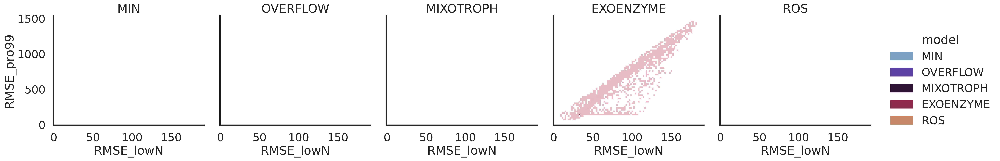

In [31]:
sns.displot(
    data=mean_scores,
    x='RMSE_lowN',  y='RMSE_pro99',
    hue='model', palette=mpalette, hue_order=morder,
    col='model', col_order=morder,
).set_titles(col_template='{col_name}', row_template='{row_name}')

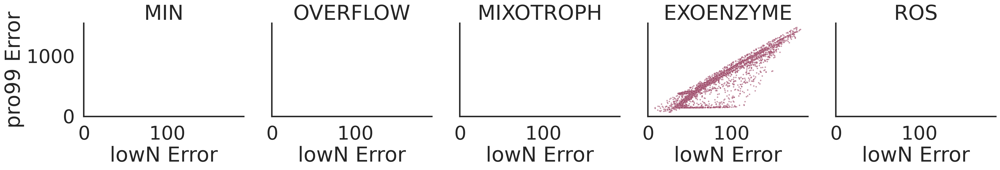

In [32]:
sns.set_context('poster',  font_scale=1.5)
g = sns.relplot(
    data=mean_scores,
    x='RMSE_lowN',  y='RMSE_pro99',
    hue='model', palette=mpalette, hue_order=morder,
    col='model', col_order=morder, #col_wrap=3,
    legend=False, s=7, alpha=0.5,
).set_titles(col_template='{col_name}', row_template='{row_name}')
g.set(xlabel='lowN Error', ylabel='pro99 Error', )
plt.savefig('figures/ponly_sobol_error.svg')

In [33]:
mean_scores

media,model,idx,RMSE_lowN,RMSE_pro99,RMSE
0,EXOENZYME,monte_ponly_fix_EXOENZYME_100_monte__0_EXOENZYME,33.222811,136.545495,67.352989
1,EXOENZYME,monte_ponly_fix_EXOENZYME_100_monte__10_EXOENZYME,88.166774,678.329088,244.552831
2,EXOENZYME,monte_ponly_fix_EXOENZYME_100_monte__11_EXOENZYME,33.222842,136.545669,67.353064
3,EXOENZYME,monte_ponly_fix_EXOENZYME_100_monte__12_EXOENZYME,57.718548,423.516226,156.348142
4,EXOENZYME,monte_ponly_fix_EXOENZYME_100_monte__13_EXOENZYME,86.886294,150.140866,114.215513
...,...,...,...,...,...
9945,EXOENZYME,monte_ponly_fix_EXOENZYME_9_monte__96_EXOENZYME,44.143435,313.790351,117.693602
9946,EXOENZYME,monte_ponly_fix_EXOENZYME_9_monte__97_EXOENZYME,85.393742,143.961311,110.875583
9947,EXOENZYME,monte_ponly_fix_EXOENZYME_9_monte__98_EXOENZYME,50.332126,349.407552,132.613818
9948,EXOENZYME,monte_ponly_fix_EXOENZYME_9_monte__99_EXOENZYME,33.222816,136.545520,67.353001


In [34]:
mean_scores_filtered = mean_scores.sort_values(
    by='RMSE',
)
#pmaxday_df #.loc[pmaxday_df[f'score_4'].ge(4)].copy()

In [35]:
mean_scores_filtered['lrank'] = mean_scores_filtered.groupby("model")["RMSE"].rank(method='first')
mean_scores_filtered['fit'] = 'bad'
#mean_scores_filtered.loc[mean_scores_filtered.lrank.le(100), 'fit'] = 'good'
mean_scores_filtered.loc[mean_scores_filtered.RMSE.le(60), 'fit'] = 'good'



In [36]:
mean_scores_filtered.fit.value_counts()

bad     9906
good      44
Name: fit, dtype: int64

In [37]:
bestids = mean_scores_filtered.loc[mean_scores_filtered.fit.isin(['good']), 'idx']

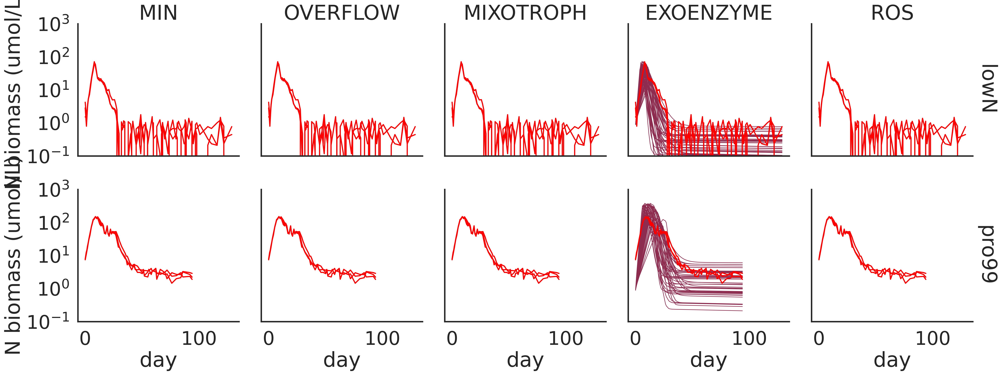

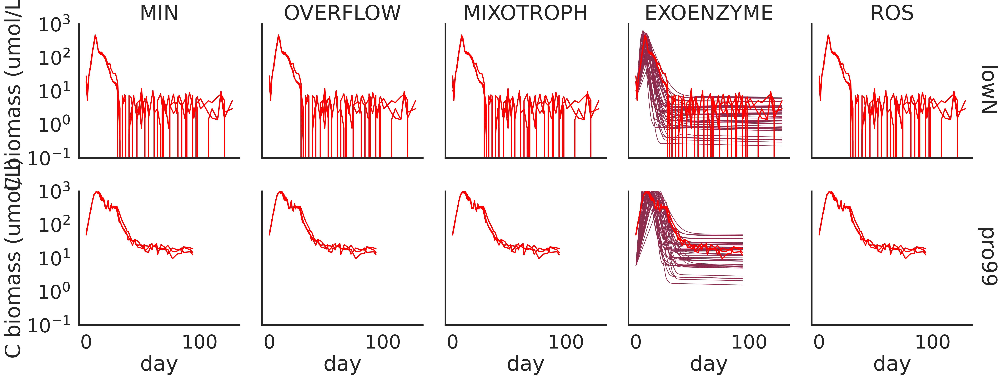

In [38]:
for n in ('N', 'C'):
    l= 'RMSE'
    g = sns.relplot(
        data=df.loc[df.idx.isin(bestids)],
        kind='line', 
        estimator=None, units='idx',
        x='day', y=f'Bptotal[{n}]', 
        row='media', row_order=media_order, lw=1,
        hue='model', hue_order=morder, palette=mpalette,
        col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        legend=False
    )
    for (row_val,col_val), ax in g.axes_dict.items():
        datadf = refdf if row_val == 'lowN' else refp99df
        sns.lineplot(data=datadf, x='day', y=f'ref_Bp[{n}]',
        units='Sample', estimator=None, ax=ax, lw=2, color='red',

                     legend=False
                    )
    g.set(yscale='log', ylim=(1e-1,1e3))
    g.set(ylabel=f'{n} biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    #plt.suptitle(f'{n} - top models ({l})', y=1.03)

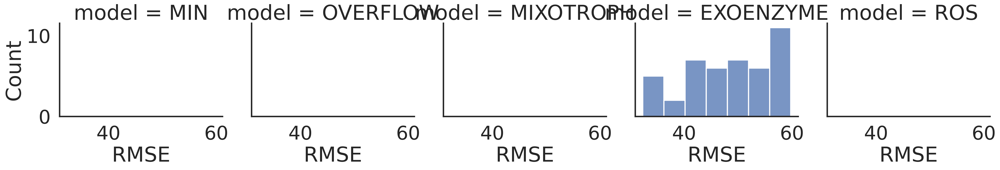

In [39]:
sns.displot(
    data=mean_scores_filtered.loc[mean_scores_filtered.fit.isin(['good'])],
    x='RMSE',
    col='model', col_order=morder,
)

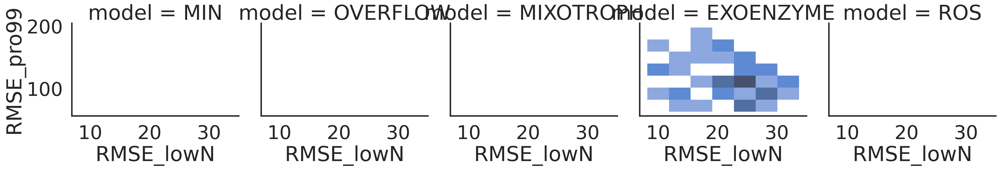

In [40]:
sns.displot(
    data=mean_scores_filtered.loc[mean_scores_filtered.fit.isin(['good'])],
    x='RMSE_lowN', y='RMSE_pro99',
    col='model', col_order=morder,
)

In [41]:
mean_scores_filtered.loc[mean_scores_filtered.idx.isin(bestids)].model.value_counts()


EXOENZYME    44
Name: model, dtype: int64

In [42]:
mean_scores_filtered.model.value_counts()


EXOENZYME    9950
Name: model, dtype: int64

In [43]:
362/2607,149/995

(0.13885692366705024, 0.14974874371859295)

In [44]:
t = mean_scores_filtered[['fit']].value_counts().reset_index()
t['%'] = 100 * t[0] / t[0].sum()
t

,fit,0,%
0,bad,9906,99.557789
1,good,44,0.442211


In [45]:
mean_scores_filtered.pivot_table(columns='fit', index='model',values='idx', aggfunc='count')

fit,bad,good
model,,
EXOENZYME,9906,44


In [46]:
min_rows = mean_scores_filtered.loc[mean_scores_filtered['fit'].isin(['good'])]
min_rows

media,model,idx,RMSE_lowN,RMSE_pro99,RMSE,lrank,fit
8002,EXOENZYME,monte_ponly_fix_EXOENZYME_82_monte__49_EXOENZYME,8.275877,126.263125,32.325503,1.0,good
2713,EXOENZYME,monte_ponly_fix_EXOENZYME_34_monte__35_EXOENZYME,14.614037,75.707983,33.262581,2.0,good
6246,EXOENZYME,monte_ponly_fix_EXOENZYME_66_monte__84_EXOENZYME,11.362030,97.974713,33.364527,3.0,good
4556,EXOENZYME,monte_ponly_fix_EXOENZYME_50_monte__88_EXOENZYME,8.177165,138.131994,33.608453,4.0,good
9313,EXOENZYME,monte_ponly_fix_EXOENZYME_94_monte__66_EXOENZYME,13.563609,85.637673,34.081606,5.0,good
7874,EXOENZYME,monte_ponly_fix_EXOENZYME_81_monte__23_EXOENZYME,15.396287,90.714117,37.371923,6.0,good
1030,EXOENZYME,monte_ponly_fix_EXOENZYME_19_monte__43_EXOENZYME,18.577974,77.647911,37.980796,7.0,good
2542,EXOENZYME,monte_ponly_fix_EXOENZYME_32_monte__60_EXOENZYME,25.240462,64.192128,40.252192,8.0,good
5762,EXOENZYME,monte_ponly_fix_EXOENZYME_61_monte__96_EXOENZYME,19.844636,84.774165,41.016003,9.0,good
2765,EXOENZYME,monte_ponly_fix_EXOENZYME_34_monte__82_EXOENZYME,26.853944,63.281774,41.223358,10.0,good


### vmax per cell

uMN_per_cell = Qp = 12.5 fg/cell * 1e-9 fg->uM  / 14 (N MW)

vmax_per_sec_per_uMN = uM sec -1 uM N -1

vmax_per_day_per_uMN = vmax_per_sec_per_uMN * seconds_in_day

vmax_per_day_per_cell = vmax_per_day_per_uMN * Qp




In [47]:
#     resources* = paramkns / (paramvmax/paramM - 1)

sum_df['Vmax/K ICp'] = sum_df['VmaxICp'] / sum_df['KICp']
sum_df['Vmax/K INp'] = sum_df['VmaxINp'] / sum_df['KINp']
sum_df['R* INp'] = sum_df['KINp'] / (sum_df['VmaxINp'] / sum_df['Mp'] - 1)
sum_df['R* ICp'] = sum_df['KICp'] / (sum_df['VmaxICp'] / sum_df['Mp'] - 1)
sum_df['Vmax/Vmax Ip'] = sum_df['VmaxICp'] / sum_df['VmaxINp']



In [48]:
sum_df.columns

Index(['VmaxICp', 'VmaxICh', 'VmaxINp', 'VmaxINh', 'VmaxOCp', 'VmaxOCh',
       'VmaxONp', 'VmaxONh', 'KICp', 'KICh', 'KINp', 'KINh', 'KOCp', 'KOCh',
       'KONp', 'KONh', 'Mp', 'Mh', 'gammaDp', 'gammaDh', 'Rp', 'Rh', 'QCmaxp',
       'QCminp', 'QCmaxh', 'QCminh', 'Kmtbp', 'Kmtbh', 'bp', 'bh', 'r0p',
       'r0h', 'KdecayDON', 'KprodEXOp', 'KprodEXOh', 'OverflowMode',
       'Koverflowp', 'Koverflowh', 'ROSMode', 'KprodROSp', 'KprodROSh',
       'KlossROSp', 'KlossROSh', 'KdecayROS', 'omegaP', 'omegaH', 'ROSmaxD',
       'run_id', 'idx', 'id', 'media', 'which', 'model', 'hash', 'Vmax/K ICp',
       'Vmax/K INp', 'R* INp', 'R* ICp', 'Vmax/Vmax Ip'],
      dtype='object')

In [49]:
additional_variables = [ 'Vmax/K ICp', 'Vmax/K INp', 'R* INp', 'R* ICp', 'Vmax/Vmax Ip']
id_vars= ['model', 'idx']
sum_df1 = sum_df.drop_duplicates(subset='idx')
def _get_params_df(model):
    params_to_update, bounds, log_params = get_param_tuning_values(model, organism_to_tune)
    param_vals_map = get_param_vals(model)
    additional_variables_per_day = [
#         f'{p}_day' for p in params_per_second 
#         if p in params_to_update
    ]
    additional_variables_per_day_cell =  [
#         f'{p}_day_cell' for p in vmax_params
#         if p in params_to_update
    ]
    


    param_vals_df = sum_df1.loc[sum_df1.model.isin([model]), 
                                id_vars + params_to_update + additional_variables_per_day + additional_variables + additional_variables_per_day_cell]
    mparam_vals = param_vals_df.melt( id_vars=id_vars)    
    mparam_vals['default'] = mparam_vals['variable'].map(param_vals_map)
    mparam_vals['FC'] = np.log2(mparam_vals.value / mparam_vals.default)
    return mparam_vals
mparams_df = pd.concat([_get_params_df(model) for model in morder], ignore_index=True)


In [50]:
mparams_df = pd.merge(mean_scores_filtered, mparams_df, how='left', on=id_vars )

In [51]:
mparams_df.variable.unique()

array(['VmaxICp', 'VmaxINp', 'KICp', 'KINp', 'Mp', 'gammaDp',
       'Vmax/K ICp', 'Vmax/K INp', 'R* INp', 'R* ICp', 'Vmax/Vmax Ip'],
      dtype=object)

In [52]:
mparams_df.loc[mparams_df.variable.isna()]

,model,idx,RMSE_lowN,RMSE_pro99,RMSE,lrank,fit,variable,value,default,FC


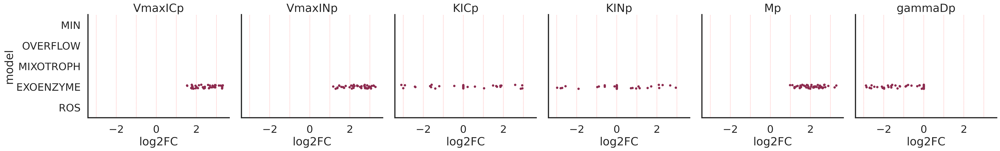

In [53]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[mparams_df['fit'].isin(['good']) & ~mparams_df['FC'].isna()].reset_index(), 
    col='variable', x='FC', y='model', col_wrap=6, order=morder,
    hue='model', hue_order=morder, palette=mpalette, 
    legend=False,
).set_titles(col_template='{col_name}', row_template='{row_name}').set(xlabel='log2FC')

for (#row_val,
     col_val), ax in g.axes_dict.items():
    #refmean = refmaxday_df.loc[refmaxday_df['media'].isin([col_val]), col].mean()
    for i in [-3,-2,-1,0,1,2,3]:
        ax.axvline(i, color='red', ls='--', alpha=0.5, lw=0.5)


In [54]:
mparams_df.loc[mparams_df.variable.isin(['Koverflowp'])]

,model,idx,RMSE_lowN,RMSE_pro99,RMSE,lrank,fit,variable,value,default,FC


In [55]:
mparams_df.fit.value_counts()

bad     108966
good       484
Name: fit, dtype: int64

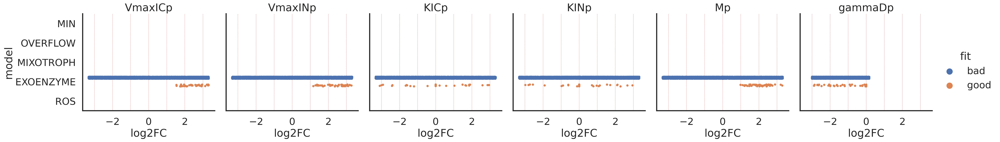

In [56]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[~mparams_df['FC'].isna()].reset_index(), 
    col='variable', x='FC', y='model', col_wrap=6, order=morder,
    hue='fit', hue_order=['bad','good', ], #morder, palette=mpalette, 
    dodge=True,
    #legend=False,
).set_titles(col_template='{col_name}', row_template='{row_name}').set(xlabel='log2FC')

for (#row_val,
     col_val), ax in g.axes_dict.items():
    #refmean = refmaxday_df.loc[refmaxday_df['media'].isin([col_val]), col].mean()
    for i in [-3,-2,-1,0,1,2,3]:
        ax.axvline(i, color='red', ls='--', alpha=0.5, lw=0.5)


In [57]:
variables_to_show_log = ['gammaDp', 'KINp', 'KICp',
      'Mp_day',  'VmaxINp_day_cell', 'VmaxICp_day_cell',
       'gamma_DON2DINp_day_cell', 'KONp', 'KOCp', 'VmaxONp', 'VmaxOCp',
       'VmaxOCp_day_cell', 'VmaxONp_day_cell', 'omegaP',
       'E_ROSp_day']

variables_to_show_nolog = ['Vmax/K ICp', 'Vmax/K INp', 'R* INp',
       'R* ICp', 'Vmax/Vmax Ip',]


In [58]:
    min_params_to_update, _, _ = get_param_tuning_values('MIN', organism_to_tune)


In [59]:
from scipy.stats import pearsonr

def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)

In [60]:
def _get_corrs(model):
    mrows = min_rows 
    cur_params_to_update, _, _ = get_param_tuning_values(model, organism_to_tune)

    tmp = mparams_df.loc[
                    mparams_df.idx.isin(mrows.idx) &
                    mparams_df.model.isin([model]) 
                ]

    mtmp = tmp.pivot_table(index='idx', columns='variable', values='FC')[cur_params_to_update]
    corr_df = mtmp.corr()
    trimask = np.triu(np.ones_like(corr_df, dtype=bool))    
    corr_unstack = corr_df.mask(trimask).unstack().dropna()
    res_df = corr_unstack.rename_axis(['var1', 'var2']).reset_index().rename(columns={0:'correlation'})
    res_df['model'] = model
    return res_df
corr_df = pd.concat([_get_corrs(m) for m in mparams_df.model.unique() ], ignore_index=True)
corr_df

,var1,var2,correlation,model
0,VmaxICp,VmaxINp,-0.262798,EXOENZYME
1,VmaxICp,KICp,0.169972,EXOENZYME
2,VmaxICp,KINp,0.028774,EXOENZYME
3,VmaxICp,Mp,0.131954,EXOENZYME
4,VmaxICp,gammaDp,0.090885,EXOENZYME
5,VmaxINp,KICp,-0.151606,EXOENZYME
6,VmaxINp,KINp,0.083449,EXOENZYME
7,VmaxINp,Mp,0.530853,EXOENZYME
8,VmaxINp,gammaDp,-0.071704,EXOENZYME
9,KICp,KINp,0.120074,EXOENZYME


In [61]:
corr_df['pair'] = corr_df.var1 +' / ' +  corr_df.var2

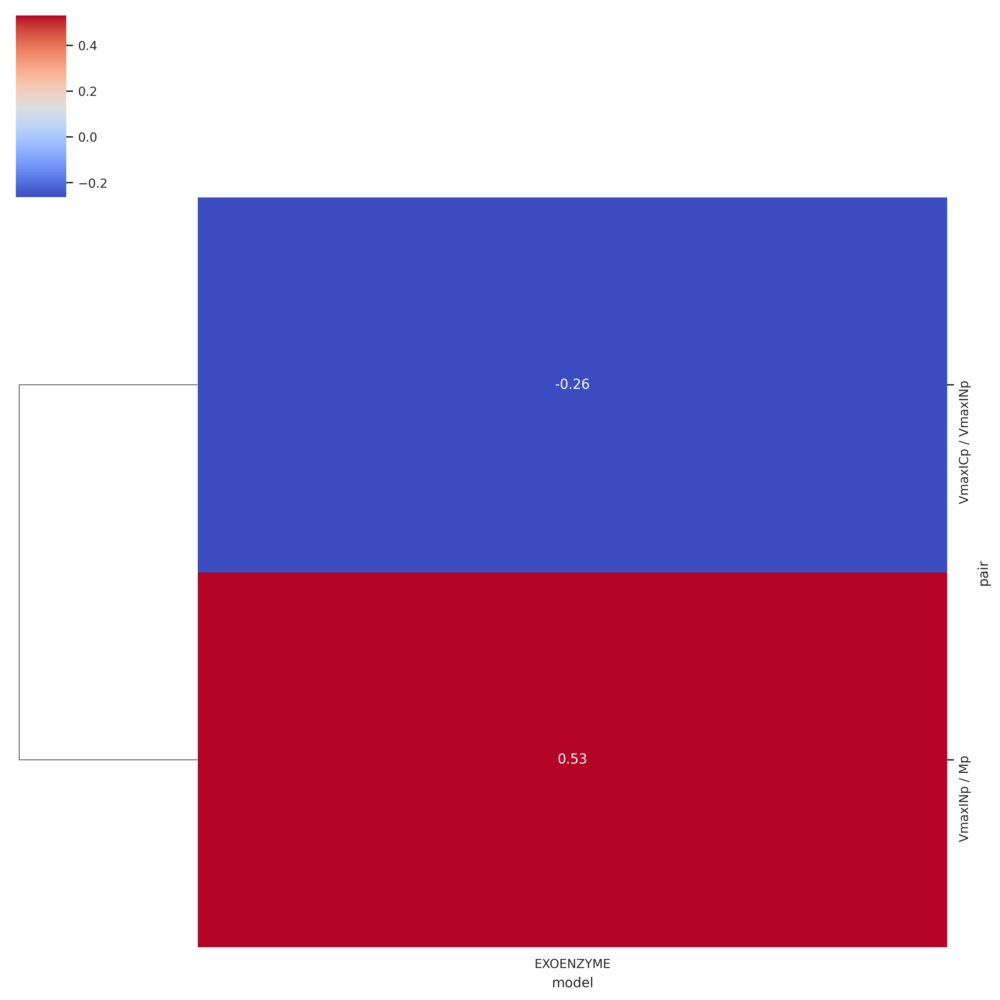

In [62]:
sns.set_context('paper')
corr_df_filtered = corr_df.loc[(corr_df.correlation > 0.2) | (corr_df.correlation < -0.2)]

pcorr_df = corr_df.loc[corr_df.pair.isin(corr_df_filtered.pair)].pivot_table(index='pair', columns=['model',  ], 
                               values='correlation', fill_value=3, dropna=True)
#pcorr_df = pcorr_df.reindex(columns=pcorr_df.columns.reindex(morder, level=0)[0])

g = sns.clustermap(
    pcorr_df, 
    cmap='coolwarm', 
    mask=pcorr_df==3,
    col_cluster=False,
    annot=True,
    figsize=(10,10),
)
ax = g.ax_heatmap  
for i in [2,4,6,8]:
    ax.axvline(i, c='black')


In [63]:
final_idxes = set(min_rows.idx)

In [64]:
selected_params = sum_df.loc[sum_df.idx.isin(final_idxes)]

In [65]:
from scipy.cluster.vq import whiten
from scipy.cluster.hierarchy import fcluster, linkage

#def _get_clusters(model):
#model='MIN'
#cur_params_to_update, _, _ = get_param_tuning_values(model, organism_to_tune)

cur_params_to_update = ['VmaxICp', 'VmaxINp', 'Mp',]

tmp = mparams_df.loc[
                mparams_df.idx.isin(final_idxes) #&
                #mparams_df.model.isin([model]) 
            ]

mtmp = tmp.pivot_table(index=['model','idx'], columns='variable', values='FC')[cur_params_to_update]


# standardize (normalize) the features
data = whiten(mtmp)

# Compute the distance matrix
matrix = linkage(
    data,
    method='ward',
    #method='average',
    #method='single',
    #method='centroid',
    #method='complete',
    metric='euclidean'
    )

# Assign cluster labels
labels = fcluster(
    matrix, 10, 
    criterion='distance'
    )

# Create DataFrame
#mtmp['labels'] = labels
    
#mtmp = _get_clusters('MIN')
# corr_df = pd.concat([_get_corrs(m,l) for m in morder for l in ('RMSE', 'lRMSE')], ignore_index=True)
# corr_df

In [66]:
labels_series = pd.Series(labels, index= mtmp.index.get_level_values(1))

In [67]:
mparams_df['cluster'] = mparams_df.idx.map(labels_series)

In [68]:
mparams_df['cluster'].value_counts()

1.0    484
Name: cluster, dtype: int64

In [69]:
mtmp

variable                                                     VmaxICp  \
model     idx                                                          
EXOENZYME monte_ponly_fix_EXOENZYME_11_monte__64_EXOENZYME  3.288664   
          monte_ponly_fix_EXOENZYME_14_monte__93_EXOENZYME  1.791698   
          monte_ponly_fix_EXOENZYME_15_monte__42_EXOENZYME  2.934905   
          monte_ponly_fix_EXOENZYME_17_monte__73_EXOENZYME  1.965218   
          monte_ponly_fix_EXOENZYME_17_monte__91_EXOENZYME  2.924843   
          monte_ponly_fix_EXOENZYME_19_monte__32_EXOENZYME  3.126789   
          monte_ponly_fix_EXOENZYME_19_monte__43_EXOENZYME  2.245667   
          monte_ponly_fix_EXOENZYME_1_monte__38_EXOENZYME   1.760213   
          monte_ponly_fix_EXOENZYME_1_monte__98_EXOENZYME   2.336398   
          monte_ponly_fix_EXOENZYME_21_monte__35_EXOENZYME  2.325378   
          monte_ponly_fix_EXOENZYME_25_monte__61_EXOENZYME  1.742506   
          monte_ponly_fix_EXOENZYME_2_monte__42_EXOENZYME   2.424165   
          monte_ponly_fix_EXOENZYME_30_monte__38_EXOENZYME  2.412695   
          monte_ponly_fix_EXOENZYME_32_monte__60_EXOENZYME  2.961661   
          monte_ponly_fix_EXOENZYME_34_monte__35_EXOENZYME  2.420669   
          monte_ponly_fix_EXOENZYME_34_monte__82_EXOENZYME  3.219572   
          monte_ponly_fix_EXOENZYME_34_monte__94_EXOENZYME  2.927314   
          monte_ponly_fix_EXOENZYME_36_monte__16_EXOENZYME  1.544865   
          monte_ponly_fix_EXOENZYME_38_monte__49_EXOENZYME  2.675783   
          monte_ponly_fix_EXOENZYME_42_monte__23_EXOENZYME  2.362213   
          monte_ponly_fix_EXOENZYME_45_monte__77_EXOENZYME  3.285536   
          monte_ponly_fix_EXOENZYME_46_monte__43_EXOENZYME  3.320296   
          monte_ponly_fix_EXOENZYME_50_monte__88_EXOENZYME  1.784531   
          monte_ponly_fix_EXOENZYME_53_monte__62_EXOENZYME  2.808785   
          monte_ponly_fix_EXOENZYME_58_monte__56_EXOENZYME  2.079038   
          monte_ponly_fix_EXOENZYME_58_monte__79_EXOENZYME  2.637257   
          monte_ponly_fix_EXOENZYME_59_monte__50_EXOENZYME  1.956150   
          monte_ponly_fix_EXOENZYME_59_monte__93_EXOENZYME  3.290556   
          monte_ponly_fix_EXOENZYME_60_monte__53_EXOENZYME  2.629529   
          monte_ponly_fix_EXOENZYME_61_monte__96_EXOENZYME  2.693018   
          monte_ponly_fix_EXOENZYME_66_monte__84_EXOENZYME  1.792653   
          monte_ponly_fix_EXOENZYME_73_monte__45_EXOENZYME  1.859762   
          monte_ponly_fix_EXOENZYME_7_monte__89_EXOENZYME   2.941664   
          monte_ponly_fix_EXOENZYME_81_monte__23_EXOENZYME  2.928635   
          monte_ponly_fix_EXOENZYME_81_monte__95_EXOENZYME  2.777281   
          monte_ponly_fix_EXOENZYME_82_monte__48_EXOENZYME  2.885089   
          monte_ponly_fix_EXOENZYME_82_monte__49_EXOENZYME  1.770769   
          monte_ponly_fix_EXOENZYME_89_monte__70_EXOENZYME  2.007599   
          monte_ponly_fix_EXOENZYME_91_monte__96_EXOENZYME  2.383898   
          monte_ponly_fix_EXOENZYME_94_monte__43_EXOENZYME  1.536853   
          monte_ponly_fix_EXOENZYME_94_monte__66_EXOENZYME  2.128657   
          monte_ponly_fix_EXOENZYME_97_monte__24_EXOENZYME  2.918010   
          monte_ponly_fix_EXOENZYME_97_monte__4_EXOENZYME   1.809869   
          monte_ponly_fix_EXOENZYME_97_monte__86_EXOENZYME  2.584461   

variable                                                     VmaxINp        Mp  
model     idx                                                                   
EXOENZYME monte_ponly_fix_EXOENZYME_11_monte__64_EXOENZYME  1.375848  2.148471  
          monte_ponly_fix_EXOENZYME_14_monte__93_EXOENZYME  2.786845  2.372828  
          monte_ponly_fix_EXOENZYME_15_monte__42_EXOENZYME  2.516958  2.747611  
          monte_ponly_fix_EXOENZYME_17_monte__73_EXOENZYME  1.578437  0.986446  
          monte_ponly_fix_EXOENZYME_17_monte__91_EXOENZYME  1.169636  1.536803  
          monte_ponly_fix_EXOENZYME_19_monte__32_EXOENZYME  2.583336  3.210924  
          monte_ponly_fix_EXOENZYME_19_

kmeans.labels_

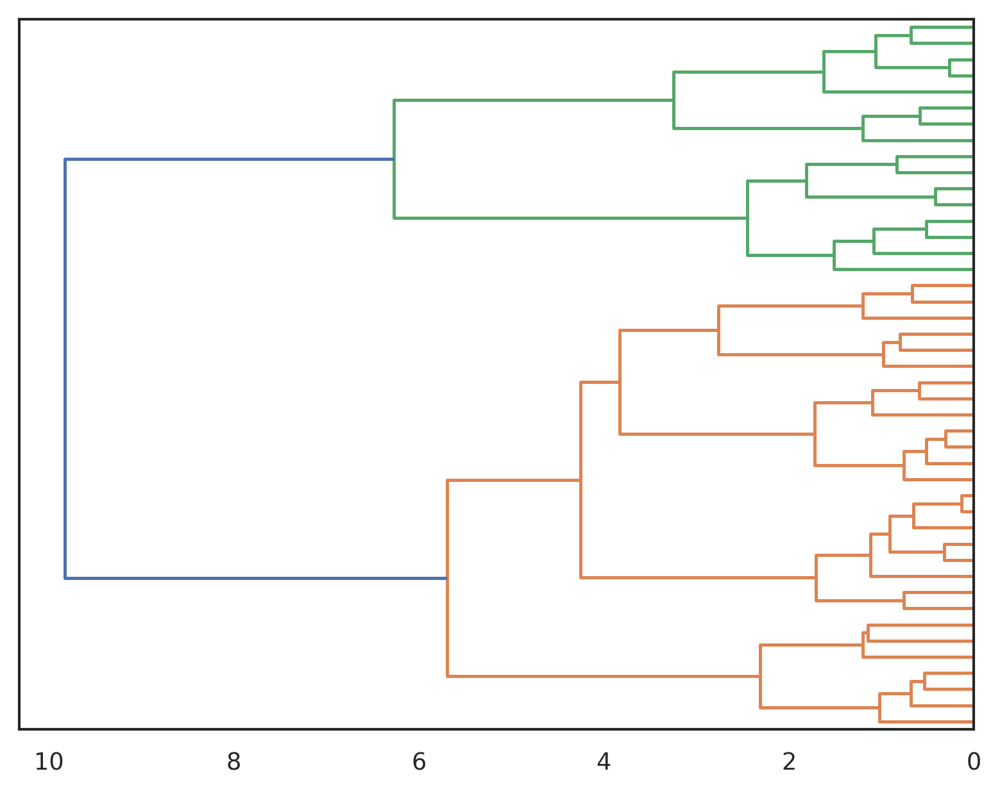

In [70]:
from scipy.cluster.hierarchy import dendrogram

dendrogram(matrix, no_labels=True, orientation='left')
plt.show()

In [71]:
lut = dict(zip(np.unique(labels), sns.color_palette('Set2', n_colors=np.max(labels)+1).as_hex()))
row_colors = np.vectorize(lut.get)(labels) 


In [72]:
mtmp

variable                                                     VmaxICp  \
model     idx                                                          
EXOENZYME monte_ponly_fix_EXOENZYME_11_monte__64_EXOENZYME  3.288664   
          monte_ponly_fix_EXOENZYME_14_monte__93_EXOENZYME  1.791698   
          monte_ponly_fix_EXOENZYME_15_monte__42_EXOENZYME  2.934905   
          monte_ponly_fix_EXOENZYME_17_monte__73_EXOENZYME  1.965218   
          monte_ponly_fix_EXOENZYME_17_monte__91_EXOENZYME  2.924843   
          monte_ponly_fix_EXOENZYME_19_monte__32_EXOENZYME  3.126789   
          monte_ponly_fix_EXOENZYME_19_monte__43_EXOENZYME  2.245667   
          monte_ponly_fix_EXOENZYME_1_monte__38_EXOENZYME   1.760213   
          monte_ponly_fix_EXOENZYME_1_monte__98_EXOENZYME   2.336398   
          monte_ponly_fix_EXOENZYME_21_monte__35_EXOENZYME  2.325378   
          monte_ponly_fix_EXOENZYME_25_monte__61_EXOENZYME  1.742506   
          monte_ponly_fix_EXOENZYME_2_monte__42_EXOENZYME   2.424165   
          monte_ponly_fix_EXOENZYME_30_monte__38_EXOENZYME  2.412695   
          monte_ponly_fix_EXOENZYME_32_monte__60_EXOENZYME  2.961661   
          monte_ponly_fix_EXOENZYME_34_monte__35_EXOENZYME  2.420669   
          monte_ponly_fix_EXOENZYME_34_monte__82_EXOENZYME  3.219572   
          monte_ponly_fix_EXOENZYME_34_monte__94_EXOENZYME  2.927314   
          monte_ponly_fix_EXOENZYME_36_monte__16_EXOENZYME  1.544865   
          monte_ponly_fix_EXOENZYME_38_monte__49_EXOENZYME  2.675783   
          monte_ponly_fix_EXOENZYME_42_monte__23_EXOENZYME  2.362213   
          monte_ponly_fix_EXOENZYME_45_monte__77_EXOENZYME  3.285536   
          monte_ponly_fix_EXOENZYME_46_monte__43_EXOENZYME  3.320296   
          monte_ponly_fix_EXOENZYME_50_monte__88_EXOENZYME  1.784531   
          monte_ponly_fix_EXOENZYME_53_monte__62_EXOENZYME  2.808785   
          monte_ponly_fix_EXOENZYME_58_monte__56_EXOENZYME  2.079038   
          monte_ponly_fix_EXOENZYME_58_monte__79_EXOENZYME  2.637257   
          monte_ponly_fix_EXOENZYME_59_monte__50_EXOENZYME  1.956150   
          monte_ponly_fix_EXOENZYME_59_monte__93_EXOENZYME  3.290556   
          monte_ponly_fix_EXOENZYME_60_monte__53_EXOENZYME  2.629529   
          monte_ponly_fix_EXOENZYME_61_monte__96_EXOENZYME  2.693018   
          monte_ponly_fix_EXOENZYME_66_monte__84_EXOENZYME  1.792653   
          monte_ponly_fix_EXOENZYME_73_monte__45_EXOENZYME  1.859762   
          monte_ponly_fix_EXOENZYME_7_monte__89_EXOENZYME   2.941664   
          monte_ponly_fix_EXOENZYME_81_monte__23_EXOENZYME  2.928635   
          monte_ponly_fix_EXOENZYME_81_monte__95_EXOENZYME  2.777281   
          monte_ponly_fix_EXOENZYME_82_monte__48_EXOENZYME  2.885089   
          monte_ponly_fix_EXOENZYME_82_monte__49_EXOENZYME  1.770769   
          monte_ponly_fix_EXOENZYME_89_monte__70_EXOENZYME  2.007599   
          monte_ponly_fix_EXOENZYME_91_monte__96_EXOENZYME  2.383898   
          monte_ponly_fix_EXOENZYME_94_monte__43_EXOENZYME  1.536853   
          monte_ponly_fix_EXOENZYME_94_monte__66_EXOENZYME  2.128657   
          monte_ponly_fix_EXOENZYME_97_monte__24_EXOENZYME  2.918010   
          monte_ponly_fix_EXOENZYME_97_monte__4_EXOENZYME   1.809869   
          monte_ponly_fix_EXOENZYME_97_monte__86_EXOENZYME  2.584461   

variable                                                     VmaxINp        Mp  
model     idx                                                                   
EXOENZYME monte_ponly_fix_EXOENZYME_11_monte__64_EXOENZYME  1.375848  2.148471  
          monte_ponly_fix_EXOENZYME_14_monte__93_EXOENZYME  2.786845  2.372828  
          monte_ponly_fix_EXOENZYME_15_monte__42_EXOENZYME  2.516958  2.747611  
          monte_ponly_fix_EXOENZYME_17_monte__73_EXOENZYME  1.578437  0.986446  
          monte_ponly_fix_EXOENZYME_17_monte__91_EXOENZYME  1.169636  1.536803  
          monte_ponly_fix_EXOENZYME_19_monte__32_EXOENZYME  2.583336  3.210924  
          monte_ponly_fix_EXOENZYME_19_

In [73]:
mtmp.min()

variable
VmaxICp    1.536853
VmaxINp    1.169636
Mp         0.986446
dtype: float64

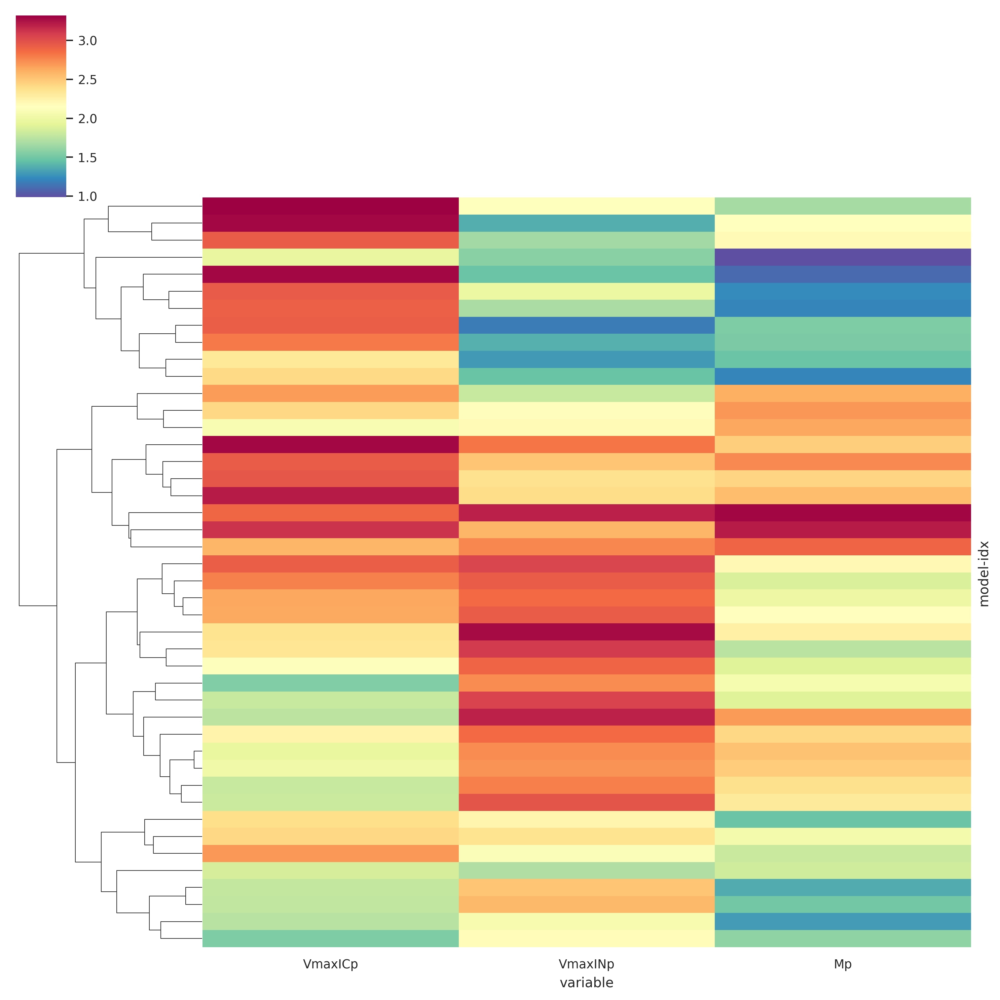

In [74]:
cg = sns.clustermap(
    data=mtmp, col_cluster=False, #row_linkage=matrix, 
    cmap='Spectral_r', #vmin=1,
    #row_colors=row_colors,
    yticklabels=False,
              )

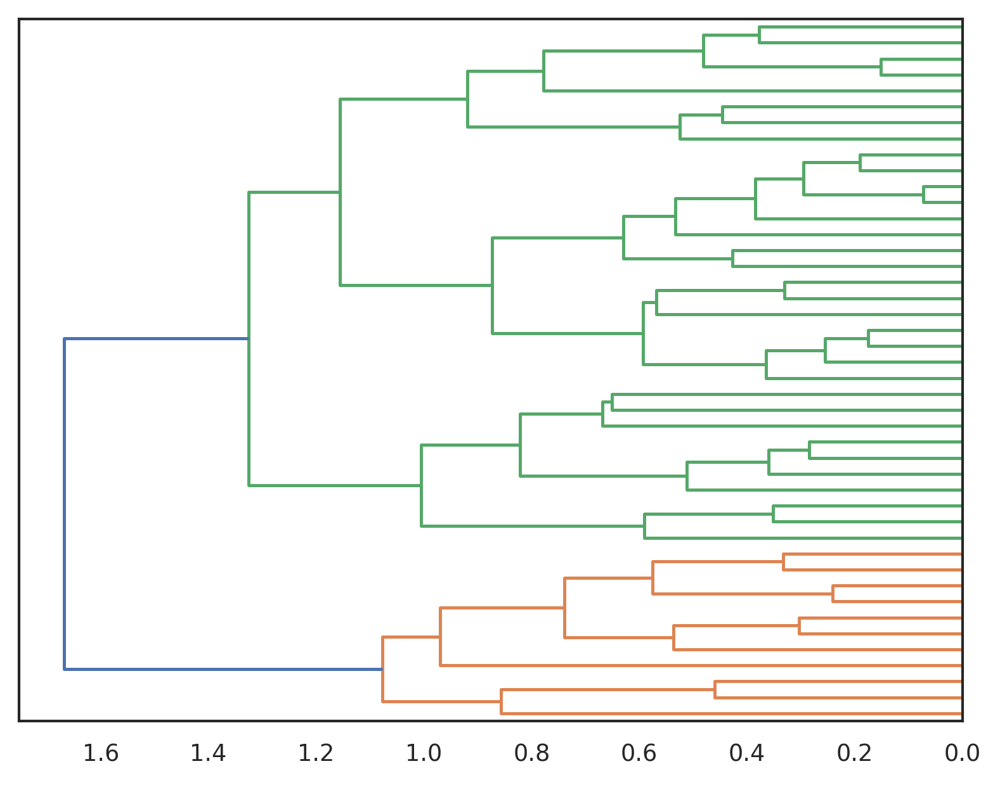

In [75]:
import scipy
matrix=cg.dendrogram_row.linkage
den = dendrogram(
    matrix, no_labels=True, orientation='left', 
    labels = mtmp.index.get_level_values(1),
    color_threshold=1.5           
          )
plt.show()
# scipy.cluster.hierarchy.dendrogram(g.dendrogram_row.linkage,
#                                          labels = mtmp.index,
#                                   #       color_threshold=0.60
#                                   )  

In [76]:
cluster_ids = pd.DataFrame(data={'labels': den['leaves_color_list']}, index=den['ivl'], )

In [77]:
mtmp1 = mtmp.copy()
mtmp1['labels'] = mtmp1.index.get_level_values(1).map(cluster_ids['labels']) 
mtmp1.reset_index(inplace=True)

In [78]:
labels=mtmp.index.get_level_values(1).map(cluster_ids['labels']) 
labels.index= mtmp.index.get_level_values(1)

In [79]:
cluster_ids.labels.value_counts()

C2    33
C1    11
Name: labels, dtype: int64

In [80]:
mtmp1.labels.value_counts()

C2    33
C1    11
Name: labels, dtype: int64

In [81]:
mparams_df['cluster'] = mparams_df.idx.map(cluster_ids['labels']) 

In [82]:
corder=['C1', 'C2', 'C3', ]

In [83]:
lut = dict(zip(corder+['C0'], sns.color_palette('Set2', n_colors=cluster_ids.labels.nunique()).as_hex()))
row_colors = np.vectorize(lut.get)(labels) 


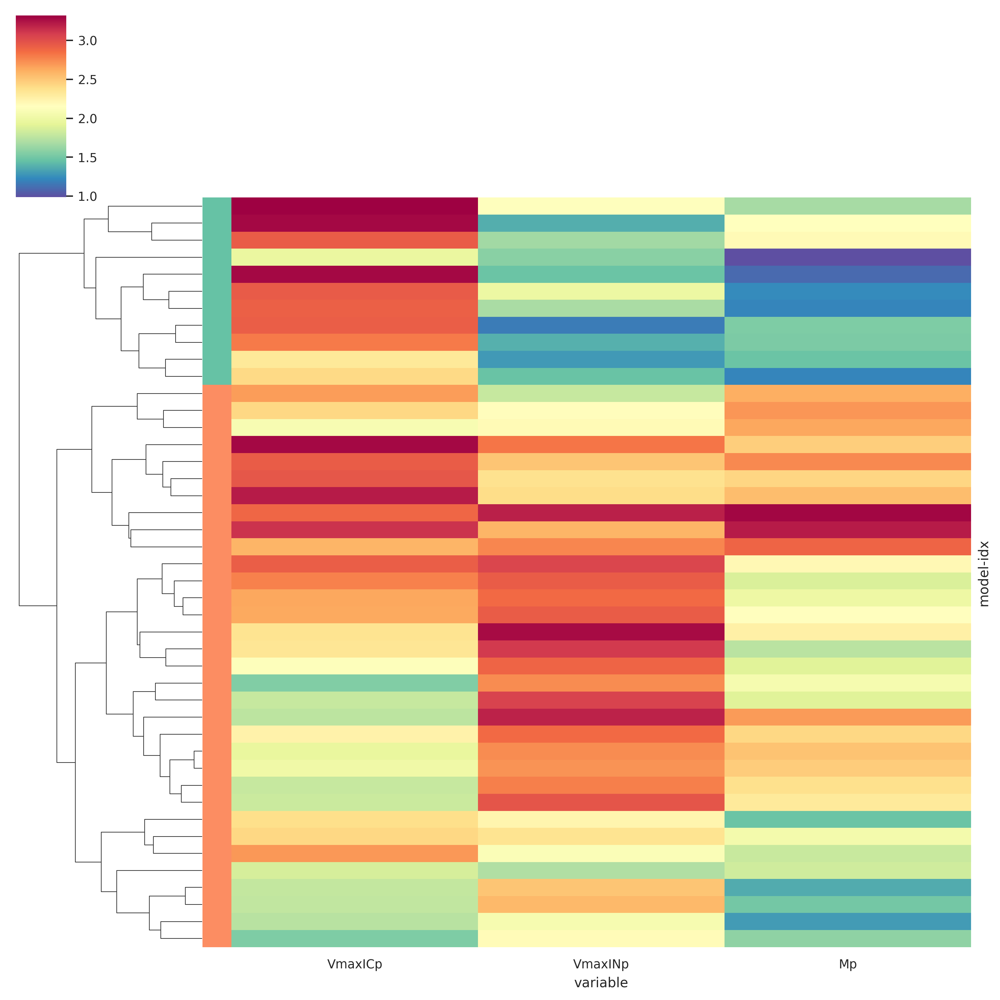

In [84]:
cg = sns.clustermap(
    data=mtmp, col_cluster=False, row_linkage=matrix, 
    cmap='Spectral_r', #vmin=1,
    row_colors=row_colors,
    yticklabels=False,
              )

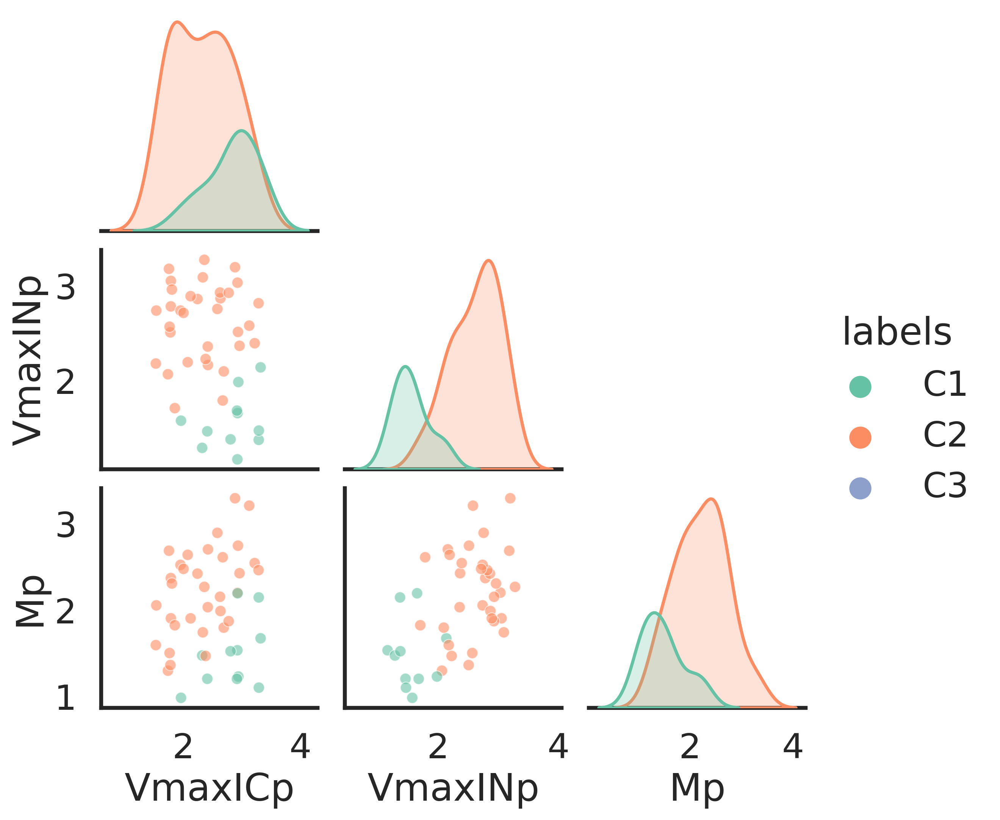

In [85]:
sns.set_context('poster')
g = sns.pairplot(
    data=mtmp1, hue='labels', palette='Set2', hue_order=corder, corner=True,
    #plot_kws=dict(marker="+", linewidth=2, alpha=0.5),
    plot_kws=dict(alpha=0.6, s=50),
)
#g.map_lower(sns.kdeplot, levels=1)


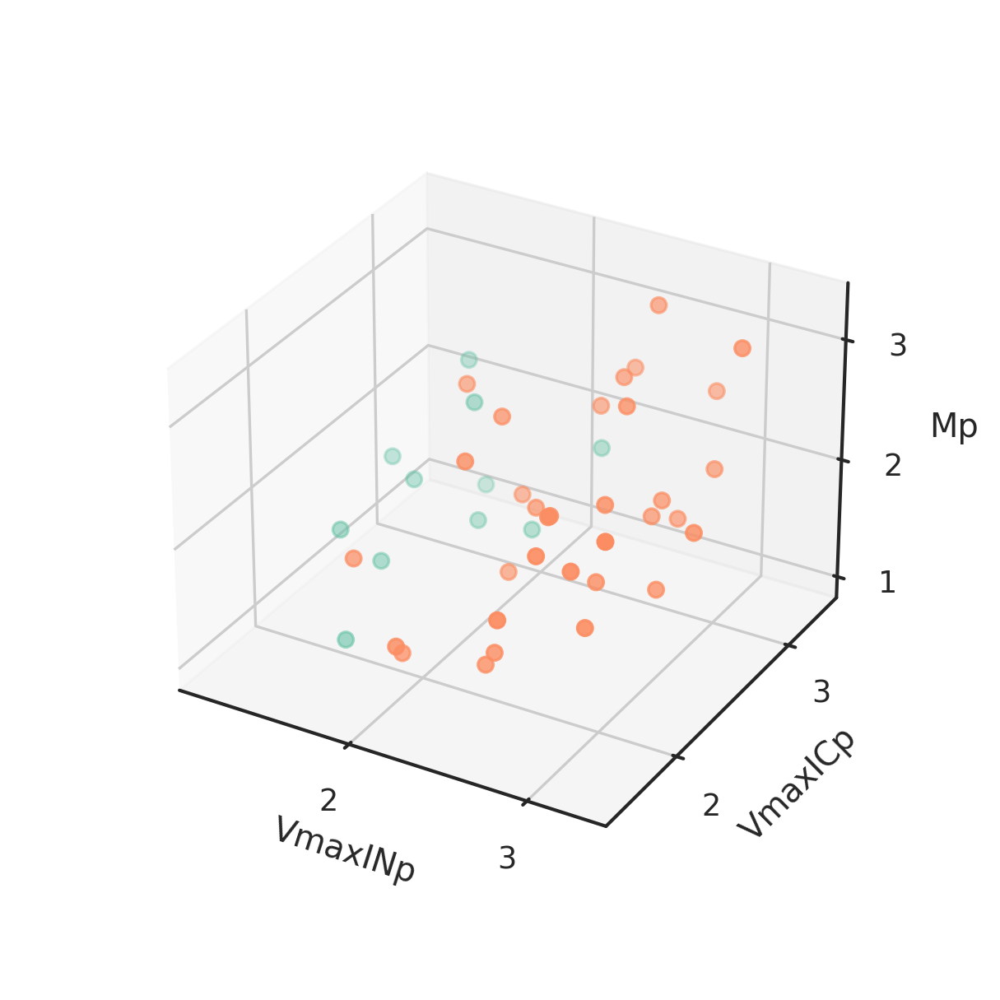

In [86]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
sns.set_context('paper')
# g = sns.pairplot(
#     data=mtmp1, hue='labels', palette='Set2', hue_order=corder,


fig = plt.figure(figsize=(5,5))
ax = plt.axes(projection = '3d')
#ax = fig.add_subplot(111, projection = '3d', )

ax.set_ylabel("VmaxICp")
ax.set_xlabel("VmaxINp")
ax.set_zlabel("Mp")
ax.set_xticks([1,2,3])
ax.set_yticks([1,2,3])
ax.set_zticks([1,2,3])
ax.scatter3D(
    data=mtmp1,
    ys = 'VmaxICp',
    xs = 'VmaxINp',
    zs = 'Mp',
    c = np.vectorize(lut.get)(mtmp1.labels) 
    
)
ax.set_box_aspect(aspect=None, zoom=0.8)
plt.show()

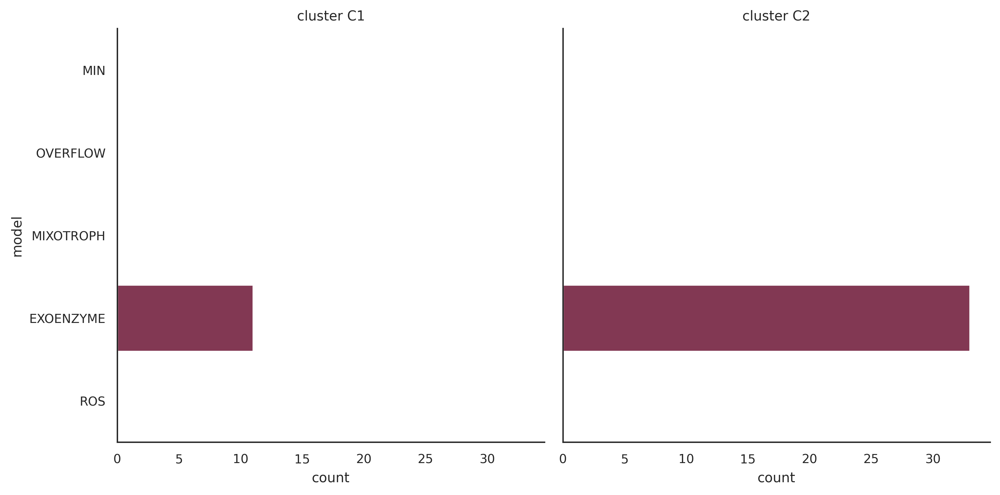

In [87]:
sns.catplot(
    data=mtmp1,
    col='labels', 
    y='model', hue='model', hue_order=morder, order=morder, palette=mpalette,dodge=False,
    kind='count',
    legend=False,
).set_titles(col_template='cluster {col_name}', row_template='{row_name}')

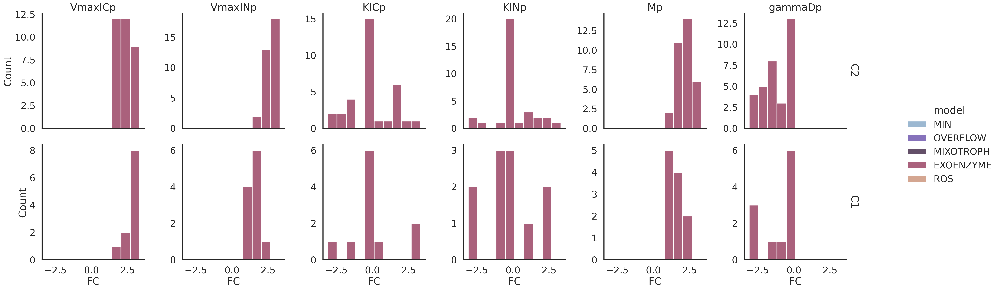

In [88]:
sns.set_context('poster')
sns.displot(
    data=mparams_df.loc[~mparams_df['cluster'].isna() & mparams_df.variable.isin(min_params_to_update)], 
    col='variable', row='cluster', x='FC',  #col_wrap=3,
    hue='model', hue_order=morder, palette=mpalette, multiple='stack',
    facet_kws=dict(sharey=False, margin_titles=True),
    
).set_titles(col_template='{col_name}', row_template='{row_name}')

In [89]:
mtmp.columns

Index(['VmaxICp', 'VmaxINp', 'Mp'], dtype='object', name='variable')

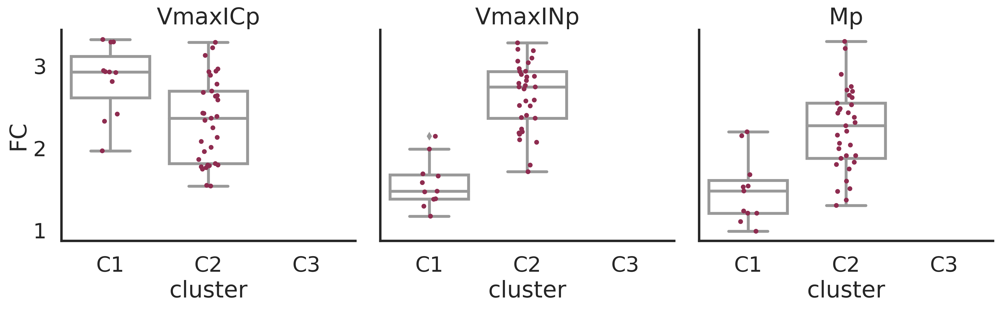

In [90]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[mparams_df['cluster'].isin(corder) & mparams_df.variable.isin(mtmp.columns)], 
    col='variable', y='FC', x='cluster', #fill=None,#hue='cluster', #col_wrap=3,
    #hue='model', hue_order=morder, palette=mpalette, #multiple='stack',
    kind='box', dodge=False, col_wrap=3,color='white', order=corder,
    facet_kws=dict(sharey=False, margin_titles=True),
    
).set_titles(col_template='{col_name}', row_template='{row_name}')
g.map_dataframe(sns.stripplot, y='FC', x='cluster', order=corder,
    hue='model', hue_order=morder, palette=mpalette, #multiple='stack',
     )


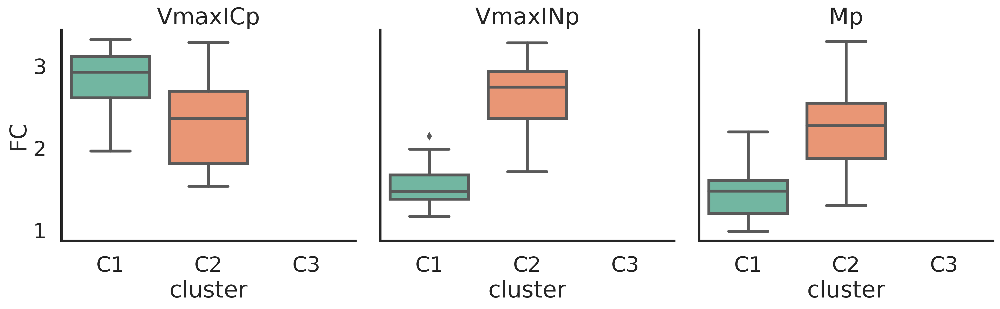

In [91]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[mparams_df['cluster'].isin(corder) & mparams_df.variable.isin(mtmp.columns)], 
    col='variable', y='FC', x='cluster', hue='cluster', 
    hue_order=corder, palette='Set2', 
    kind='box', order=corder, dodge=False,
    facet_kws=dict(sharey=False, margin_titles=True),
    
).set_titles(col_template='{col_name}', row_template='{row_name}')


In [92]:
corder1 = ['C0', 'C1', 'C2', 'C3', 'C4']

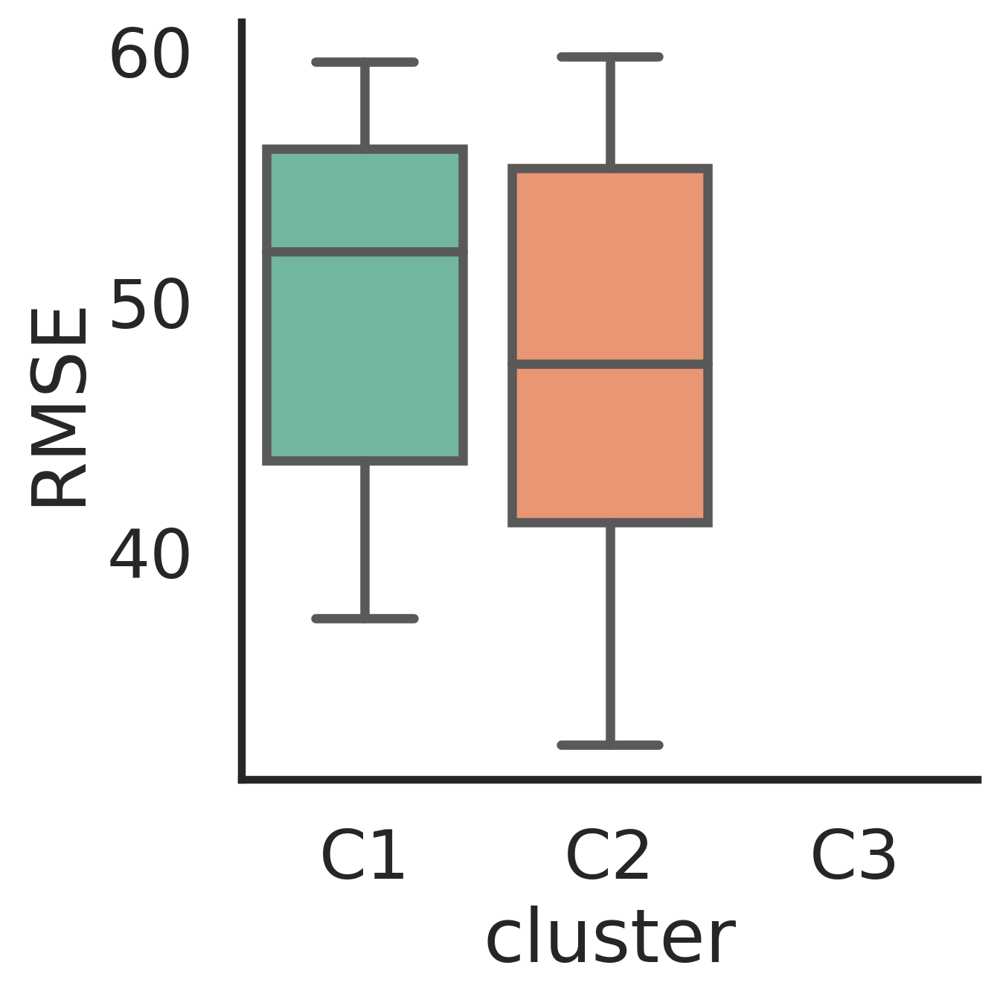

In [93]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[mparams_df['cluster'].isin(corder1) ], 
     y='RMSE', x='cluster', hue='cluster', 
    hue_order=corder, palette='Set2', 
    kind='box', order=corder, dodge=False,
    facet_kws=dict(sharey=False, margin_titles=True),
    
).set_titles(col_template='{col_name}', row_template='{row_name}')


In [94]:
mparams_df.variable.unique()

array(['VmaxICp', 'VmaxINp', 'KICp', 'KINp', 'Mp', 'gammaDp',
       'Vmax/K ICp', 'Vmax/K INp', 'R* INp', 'R* ICp', 'Vmax/Vmax Ip'],
      dtype=object)

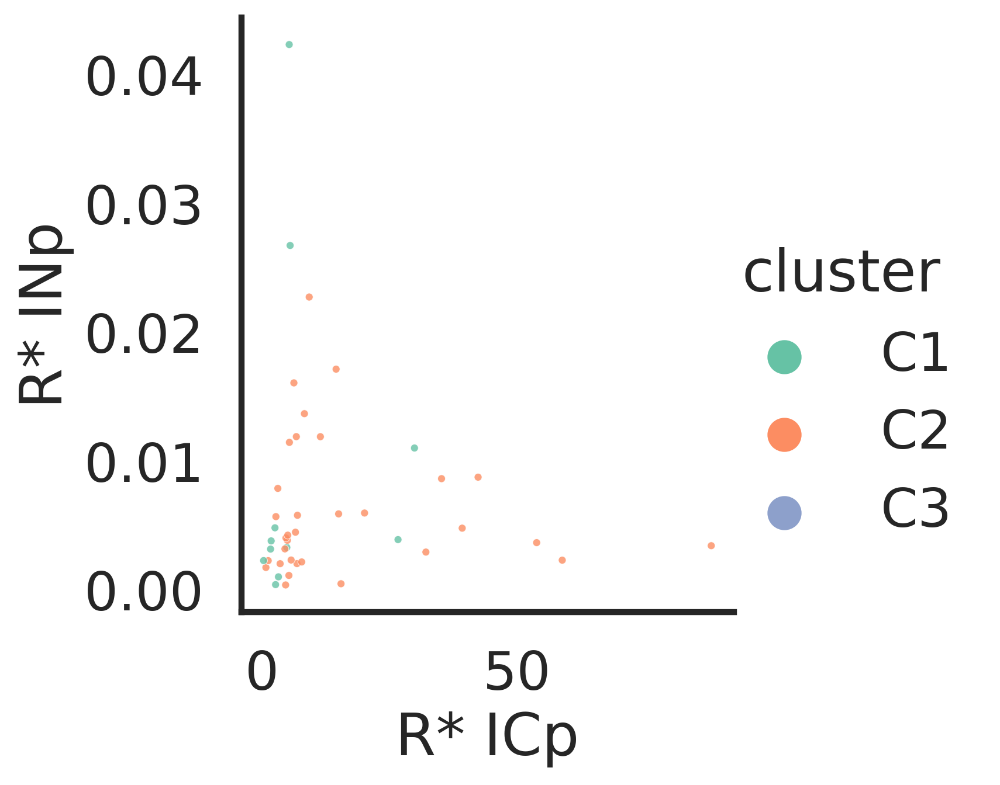

In [95]:
sns.set_context('poster')
g = sns.relplot(
    data=mparams_df.loc[
        mparams_df['cluster'].isin(corder) & mparams_df.variable.isin(['R* INp', 'R* ICp'])
    ].pivot_table(index=['model','idx', 'cluster'], columns='variable', values='value').reset_index(),
    
    y='R* INp', x='R* ICp', s=10, alpha=0.8,
    hue='cluster',hue_order=corder, palette='Set2',
    
)


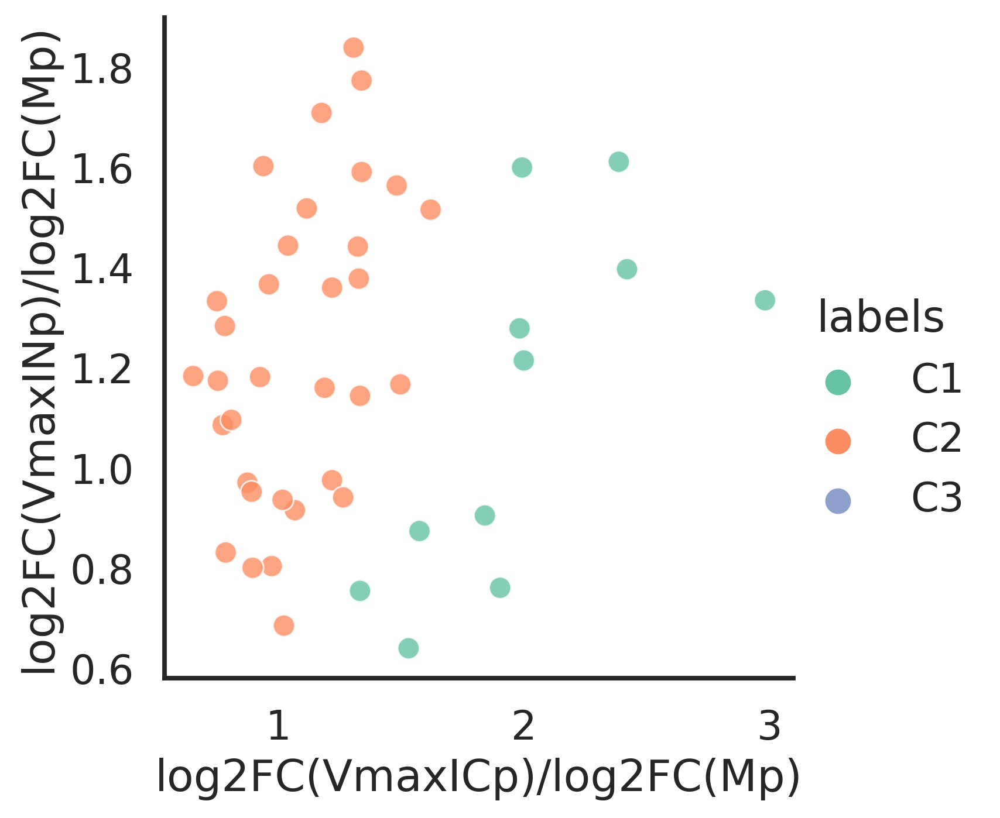

In [96]:
mtmp1['log2FC(VmaxINp)/log2FC(Mp)'] = mtmp1.VmaxINp / mtmp1.Mp
mtmp1['log2FC(VmaxICp)/log2FC(Mp)'] = mtmp1.VmaxICp / mtmp1.Mp
sns.set_context('talk')
g = sns.relplot(
    data=mtmp1,
    y='log2FC(VmaxINp)/log2FC(Mp)', x='log2FC(VmaxICp)/log2FC(Mp)', #s=10, 
    alpha=0.8,
    hue='labels',hue_order=corder, palette='Set2',
    #hue='model',hue_order=morder, palette=mpalette,
    
)


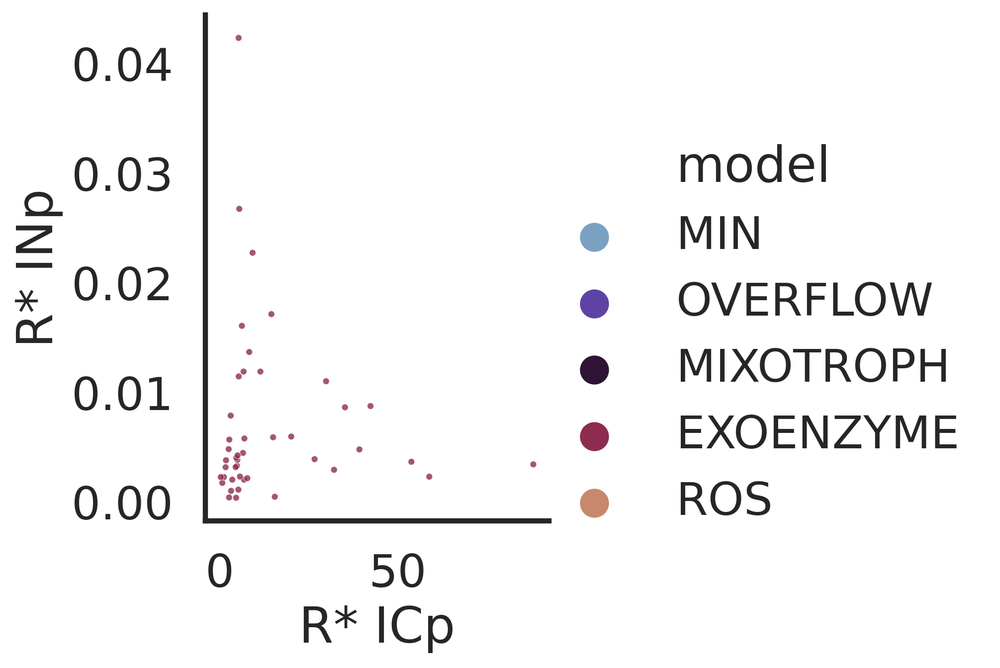

In [97]:
sns.set_context('poster')
g = sns.relplot(
    data=mparams_df.loc[
        mparams_df['cluster'].isin(corder) & mparams_df.variable.isin(['R* INp', 'R* ICp'])
    ].pivot_table(index=['model','idx', 'cluster'], columns='variable', values='value').reset_index(),
    
    y='R* INp', x='R* ICp', s=10, alpha=0.8,
    hue='model',hue_order=morder, palette=mpalette,
    
)


In [98]:
bestdf = df.loc[df.idx.isin(mtmp1.idx)]

In [99]:
bestdf = pd.merge(bestdf, mtmp1, on=['model', 'idx'])
bestdf.head()

,Bp,Np,Cp,DON,RDON,DIN,DOC,RDOC,DIC,ROS,...,media,which,model,hash,VmaxICp,VmaxINp,Mp,labels,log2FC(VmaxINp)/log2FC(Mp),log2FC(VmaxICp)/log2FC(Mp)
0,0.892857,0.000000,0.000000,3.000000,0.000000,800.000000,19.875000,0.000000,2241.552301,0.2,...,pro99,ponly,EXOENZYME,h8519271514136708373,2.675783,1.79185,2.6136,C2,0.685587,1.023792
1,0.944842,0.282351,2.412092,3.149479,0.423259,799.092927,20.958066,2.958717,2235.063631,0.2,...,pro99,ponly,EXOENZYME,h8519271514136708373,2.675783,1.79185,2.6136,C2,0.685587,1.023792
2,1.301174,0.396597,3.383881,3.391213,1.102265,797.701607,22.715322,7.759186,2226.345735,0.2,...,pro99,ponly,EXOENZYME,h8519271514136708373,2.675783,1.79185,2.6136,C2,0.685587,1.023792
3,1.880224,0.573160,4.889971,3.782677,2.194872,795.461924,25.543227,15.484450,2213.132776,0.2,...,pro99,ponly,EXOENZYME,h8519271514136708373,2.675783,1.79185,2.6136,C2,0.685587,1.023792
4,2.631816,0.802251,6.843881,4.293081,3.613053,792.552657,29.213704,25.511451,2196.640137,0.2,...,pro99,ponly,EXOENZYME,h8519271514136708373,2.675783,1.79185,2.6136,C2,0.685587,1.023792


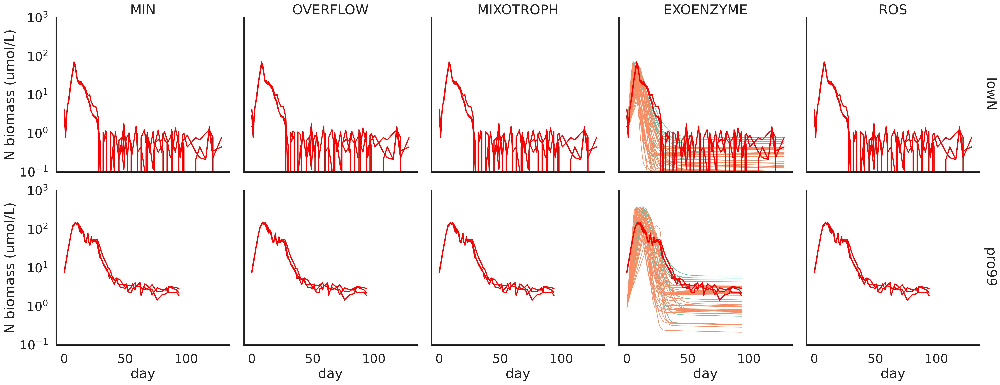

In [100]:
for n in ('N',):
    l= 'RMSE'
    g = sns.relplot(
        data=bestdf,
        kind='line', 
        estimator=None, units='idx',
        x='day', y=f'Bptotal[{n}]', 
        row='media', row_order=media_order, lw=1,
        hue='labels', hue_order=corder, palette='Set2',
        col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        legend=False
    )
    for (row_val,col_val), ax in g.axes_dict.items():
        datadf = refdf if row_val == 'lowN' else refp99df
        sns.lineplot(data=datadf, x='day', y=f'ref_Bp[{n}]',
        units='Sample', estimator=None, ax=ax, lw=2, color='red',

                     legend=False
                    )
    g.set(yscale='log', ylim=(1e-1,1e3))
    g.set(ylabel=f'{n} biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    #plt.suptitle(f'{n} - top models ({l})', y=1.03)

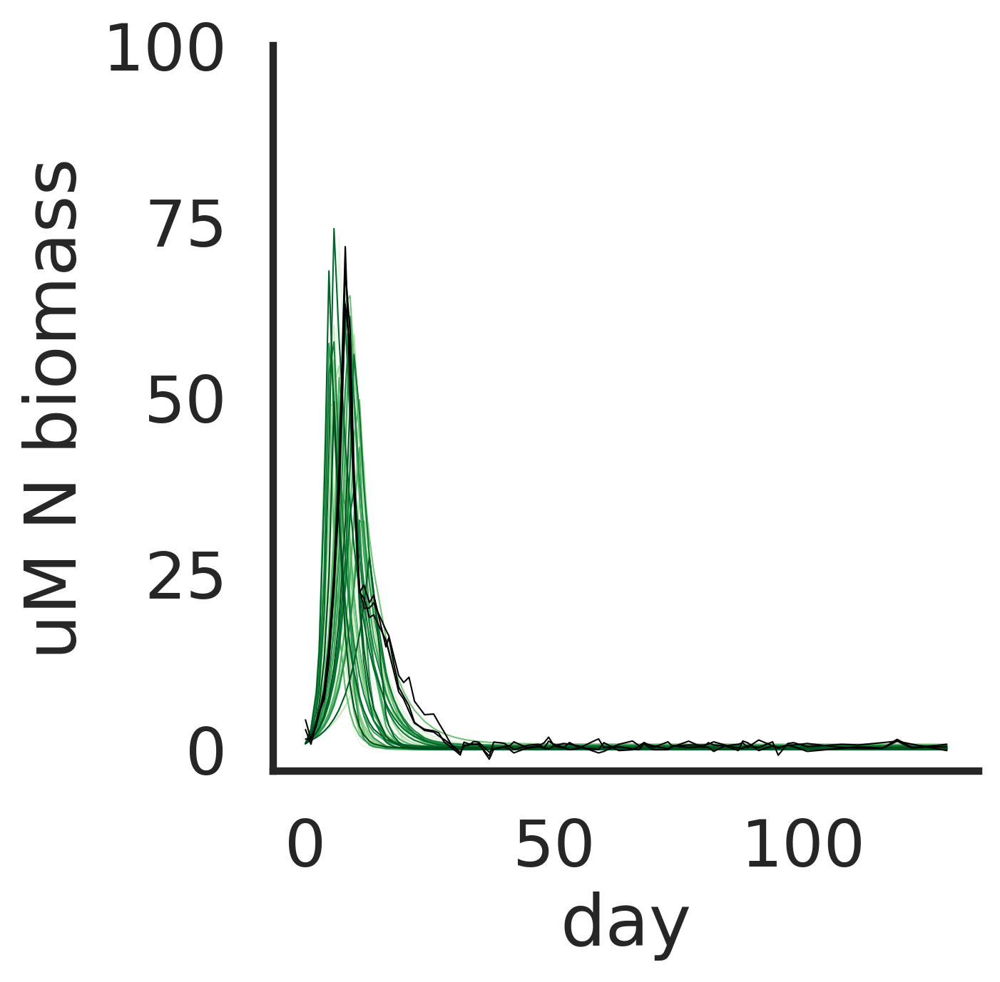

In [101]:

import matplotlib.colors as colors

curdf = bestdf
curdf = bestdf.loc[#bestdf.model.isin(['MIN']) & 
                   bestdf.media.isin(['lowN']) ]


g = sns.relplot(
    data=curdf, x='day', y='Bptotal[N]',
    units='run_id', estimator=None,
     kind='line', #hue_norm=colors.LogNorm(),
     lw=0.5, legend=False, palette='Greens',
    hue='run_id',
    facet_kws=dict(sharey=False),
)
    
datadf = refdf 
sns.lineplot(data=datadf, x='day', y='ref_Bp[N]',
units='Sample', estimator=None,  lw=0.5, color='black',

             legend=False
            )
g.set_titles(col_template='{col_name}', row_template='{row_name}')
g.set(ylabel='uM N biomass')
plt.ylim((-3,100))
#plt.suptitle(f'doubled VmaxICp', y=1.05)
plt.show()


In [102]:
corder2 = ['C1', 'C2', 'C3', 'C4', 'C0',]

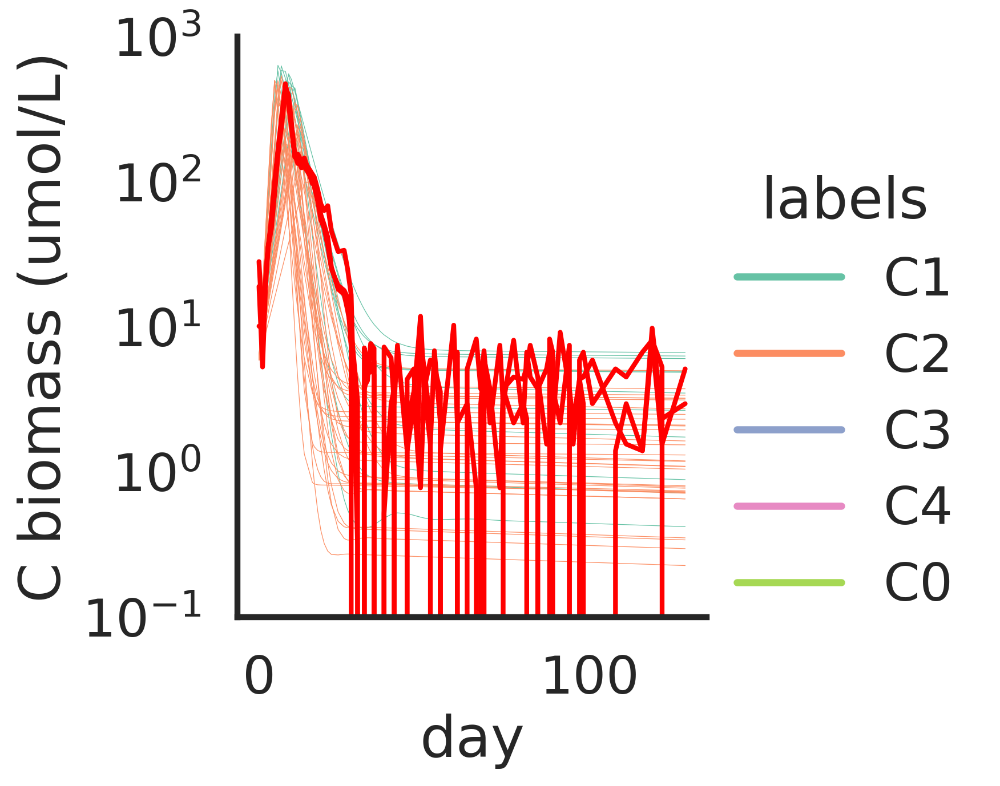

In [103]:
for n in ('C',):
    l= 'RMSE'
    g = sns.relplot(
        data=bestdf.loc[bestdf.media.isin(['lowN'])],
        kind='line', 
        estimator=None, units='idx',
        x='day', y=f'Bptotal[{n}]', 
        #row='media', row_order=media_order, 
        lw=0.3,
        hue='labels', hue_order=corder2, palette='Set2',
        #col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        #legend=False
    )
    #for row_val, ax in g.axes_dict.items():
    datadf = refdf #if row_val == 'lowN' else refp99df
    sns.lineplot(data=datadf, x='day', y=f'ref_Bp[{n}]',
    units='Sample', estimator=None, lw=2, color='red',

                 legend=False
                )
    g.set(yscale='log', ylim=(1e-1,1e3))
    g.set(ylabel=f'{n} biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    #plt.suptitle(f'{n} - top models ({l})', y=1.03)

In [104]:
bestdf.columns

Index(['Bp', 'Np', 'Cp', 'DON', 'RDON', 'DIN', 'DOC', 'RDOC', 'DIC', 'ROS',
       't', 'day', 'gross_uptakeINp', 'gross_uptakeONp', 'gross_uptakeICp',
       'gross_uptakeOCp', 'uptakeNp', 'uptakeCp', 'QCp', 'biosynthesisNp',
       'respirationCp', 'biomass_breakdownCp', 'overflowNp', 'overflowCp',
       'ROSproductionp', 'ROSlossp', 'deathbiomassNp', 'deathstoreNp',
       'deathstoreCp', 'DON2DIN_exop', 'DON2DIN', 'additionalLossRatep',
       'regNp', 'regCp', 'deathC_DOCp', 'deathN_DONp', 'Bp[C]', 'Bptotal[N]',
       'Bptotal[C]', 'run_id', 'idx', 'id', 'media', 'which', 'model', 'hash',
       'VmaxICp', 'VmaxINp', 'Mp', 'labels', 'log2FC(VmaxINp)/log2FC(Mp)',
       'log2FC(VmaxICp)/log2FC(Mp)'],
      dtype='object')

In [105]:
bestdf['Np/Bp'] = bestdf['Np'] / bestdf['Bp']
bestdf['Cp/Bp'] = bestdf['Cp'] / bestdf['Bp[C]']


In [106]:
df

,Bp,Np,Cp,DON,RDON,DIN,DOC,RDOC,DIC,ROS,...,Bp[C],Bptotal[N],Bptotal[C],run_id,idx,id,media,which,model,hash
0,0.892857,0.000000,0.000000,3.000000,0.000000,800.000000,19.875000,0.000000,2241.552301,0.2,...,5.915179,0.892857,5.915179,monte_ponly_fix_EXOENZYME_98_monte__92_pro99_p...,monte_ponly_fix_EXOENZYME_98_monte__92_EXOENZYME,monte_ponly_fix_EXOENZYME_98_monte__92,pro99,ponly,EXOENZYME,h8519271514136708373
1,0.549399,0.102843,0.115857,3.286480,0.122147,799.831989,21.665289,0.748687,2241.189627,0.2,...,3.639769,0.652242,3.755626,monte_ponly_fix_EXOENZYME_98_monte__92_pro99_p...,monte_ponly_fix_EXOENZYME_98_monte__92_EXOENZYME,monte_ponly_fix_EXOENZYME_98_monte__92,pro99,ponly,EXOENZYME,h8519271514136708373
2,0.330336,0.089661,0.093997,3.514731,0.220580,799.737550,22.978196,1.297736,2240.860328,0.2,...,2.188473,0.419997,2.282471,monte_ponly_fix_EXOENZYME_98_monte__92_pro99_p...,monte_ponly_fix_EXOENZYME_98_monte__92_EXOENZYME,monte_ponly_fix_EXOENZYME_98_monte__92,pro99,ponly,EXOENZYME,h8519271514136708373
3,0.189704,0.057641,0.058543,3.671222,0.289601,799.684689,23.864485,1.668376,2240.670618,0.2,...,1.256788,0.247345,1.315332,monte_ponly_fix_EXOENZYME_98_monte__92_pro99_p...,monte_ponly_fix_EXOENZYME_98_monte__92_EXOENZYME,monte_ponly_fix_EXOENZYME_98_monte__92,pro99,ponly,EXOENZYME,h8519271514136708373
4,0.115070,0.036093,0.036300,3.753375,0.327331,799.660989,24.342558,1.868303,2240.614002,0.2,...,0.762340,0.151163,0.798640,monte_ponly_fix_EXOENZYME_98_monte__92_pro99_p...,monte_ponly_fix_EXOENZYME_98_monte__92_EXOENZYME,monte_ponly_fix_EXOENZYME_98_monte__92,pro99,ponly,EXOENZYME,h8519271514136708373
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1313395,7.920362,0.070815,6.200989,111.542640,684.358981,0.000060,642.203527,3657.197871,2130.084756,0.2,...,52.472401,7.991177,58.673389,monte_ponly_fix_EXOENZYME_64_monte__86_pro99_p...,monte_ponly_fix_EXOENZYME_64_monte__86_EXOENZYME,monte_ponly_fix_EXOENZYME_64_monte__86,pro99,ponly,EXOENZYME,h8519271514136708373
1313396,5.505704,0.070579,3.655182,111.157569,687.158918,0.000088,645.670460,3677.571770,2162.985098,0.2,...,36.475290,5.576283,40.130472,monte_ponly_fix_EXOENZYME_64_monte__86_pro99_p...,monte_ponly_fix_EXOENZYME_64_monte__86_EXOENZYME,monte_ponly_fix_EXOENZYME_64_monte__86,pro99,ponly,EXOENZYME,h8519271514136708373
1313397,4.700817,0.070431,2.805591,110.920497,688.201007,0.000105,646.939666,3685.030430,2174.672358,0.2,...,31.142913,4.771248,33.948505,monte_ponly_fix_EXOENZYME_64_monte__86_pro99_p...,monte_ponly_fix_EXOENZYME_64_monte__86_EXOENZYME,monte_ponly_fix_EXOENZYME_64_monte__86,pro99,ponly,EXOENZYME,h8519271514136708373
1313398,3.066607,0.069853,1.079852,110.001569,690.754660,0.000170,649.972910,3702.855702,2200.314693,0.2,...,20.316268,3.136459,21.396121,monte_ponly_fix_EXOENZYME_64_monte__86_pro99_p...,monte_ponly_fix_EXOENZYME_64_monte__86_EXOENZYME,monte_ponly_fix_EXOENZYME_64_monte__86,pro99,ponly,EXOENZYME,h8519271514136708373


In [107]:
def _compute_ratio(x):
    Nstore_col = 'Np'
    Nbiomass_col = 'Bp'
    Cstore_col = 'Cp'
    Cbiomass_col = 'Bp[C]'
    qc_col = 'QCp'
    
    Nratio = x[Nstore_col] / x[Nbiomass_col]
    Cratio = x[Cstore_col] / x[Cbiomass_col]
    
    
    

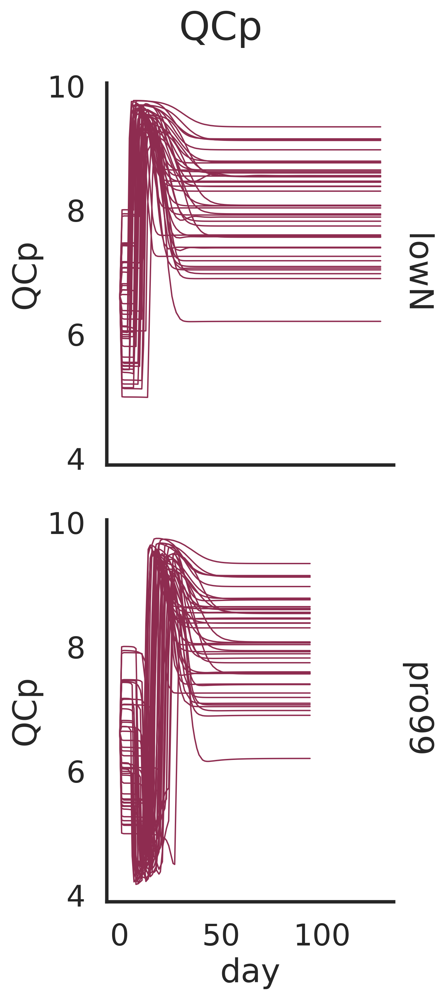

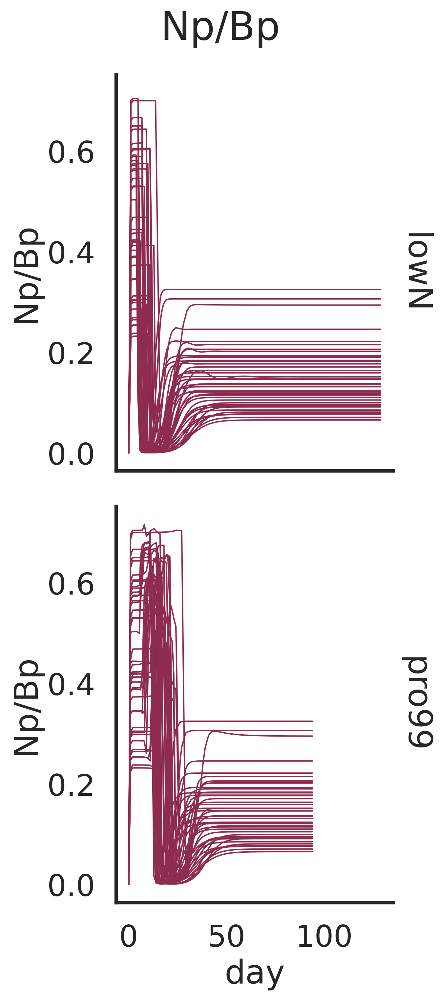

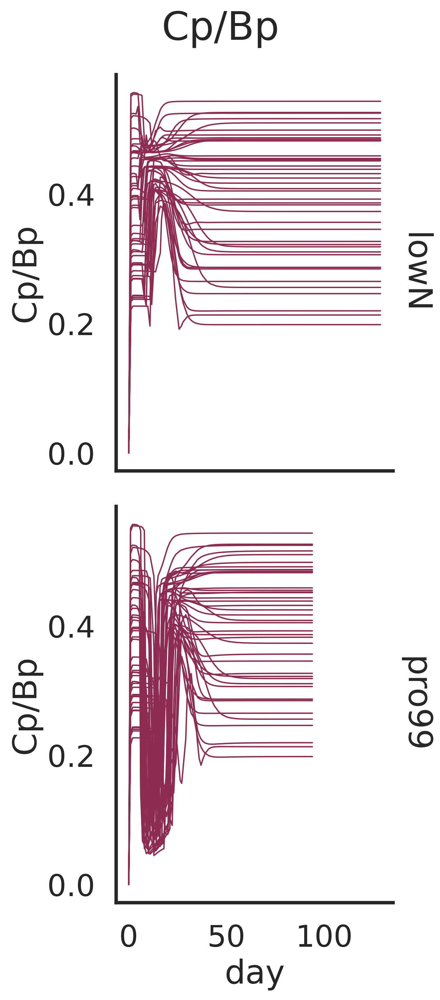

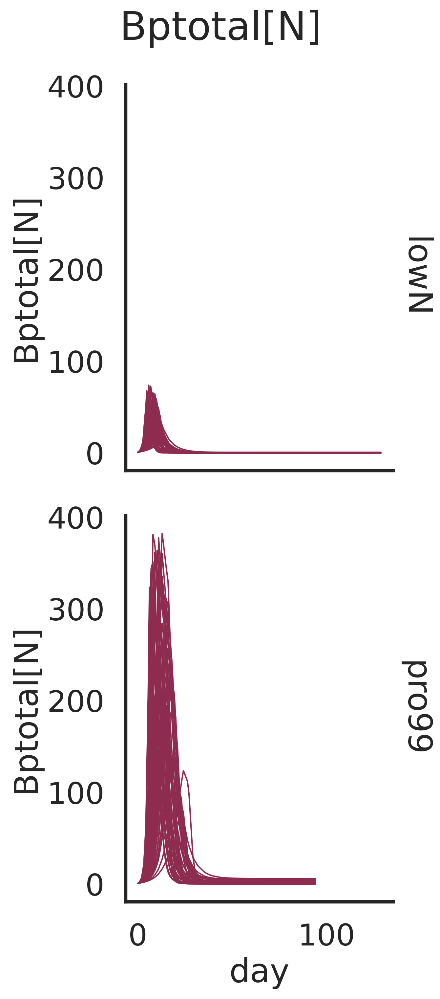

In [109]:
for n in ('QCp', 'Np/Bp','Cp/Bp', 'Bptotal[N]'):
    l= 'RMSE'
    g = sns.relplot(
        data=bestdf,
        kind='line', 
        estimator=None, units='idx',
        x='day', y=n, 
        row='media', row_order=media_order, lw=1,
        #hue='labels', hue_order=corder, palette='Set2',
        hue='model', hue_order=morder, palette=mpalette,
        #col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        legend=False
    )
    #g.set(ylabel=f'{n} biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.suptitle(n, y=1.03)

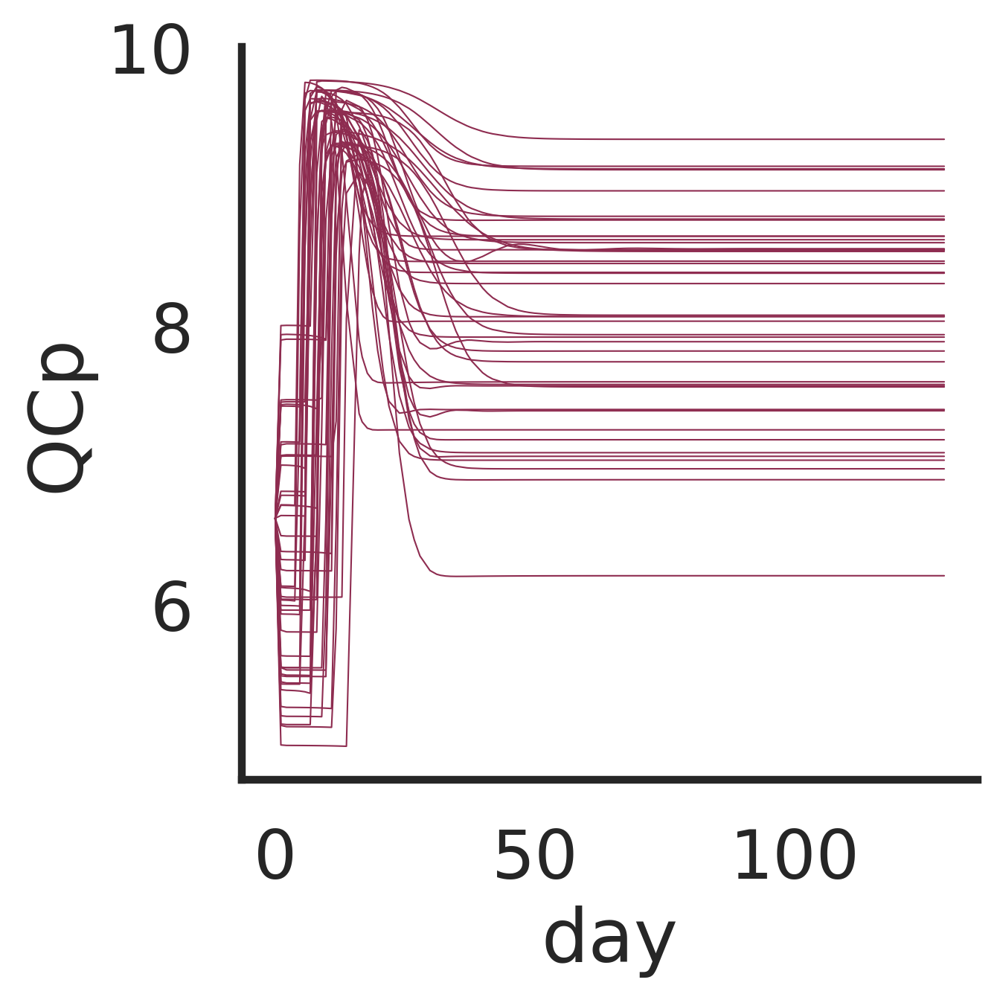

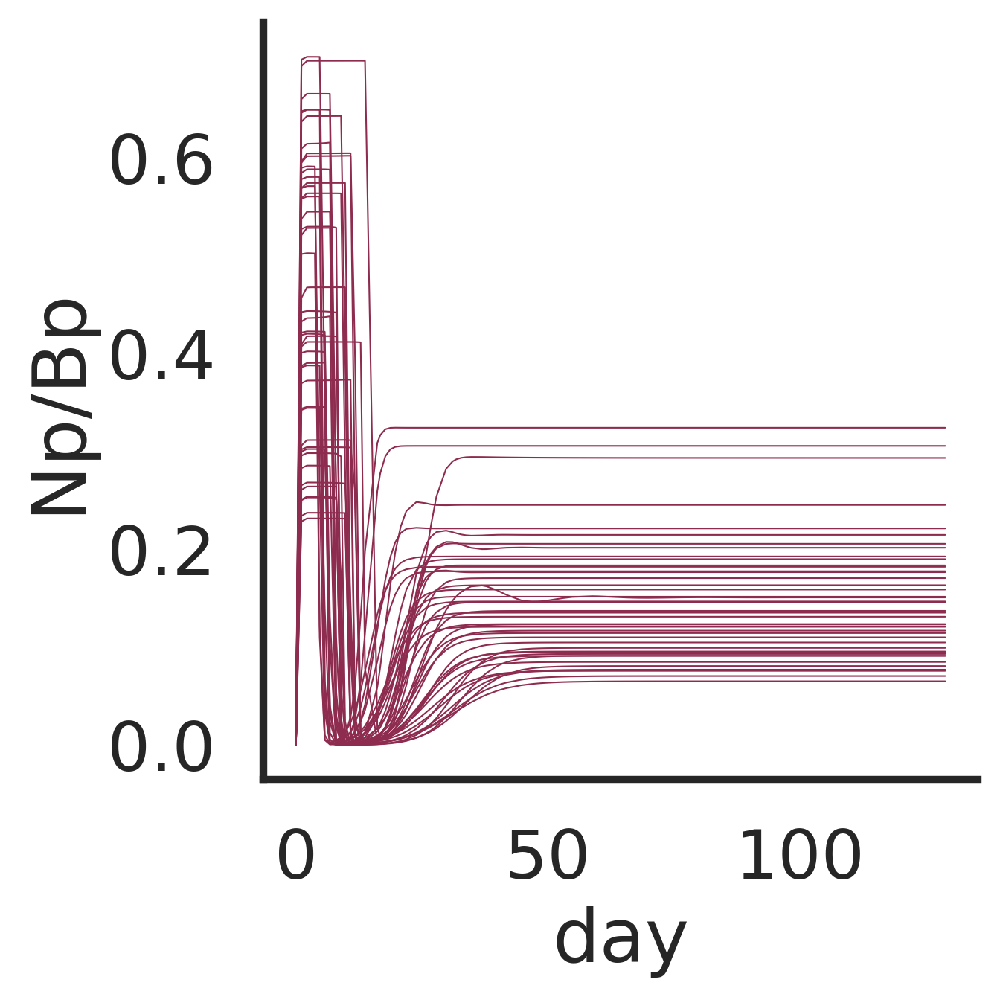

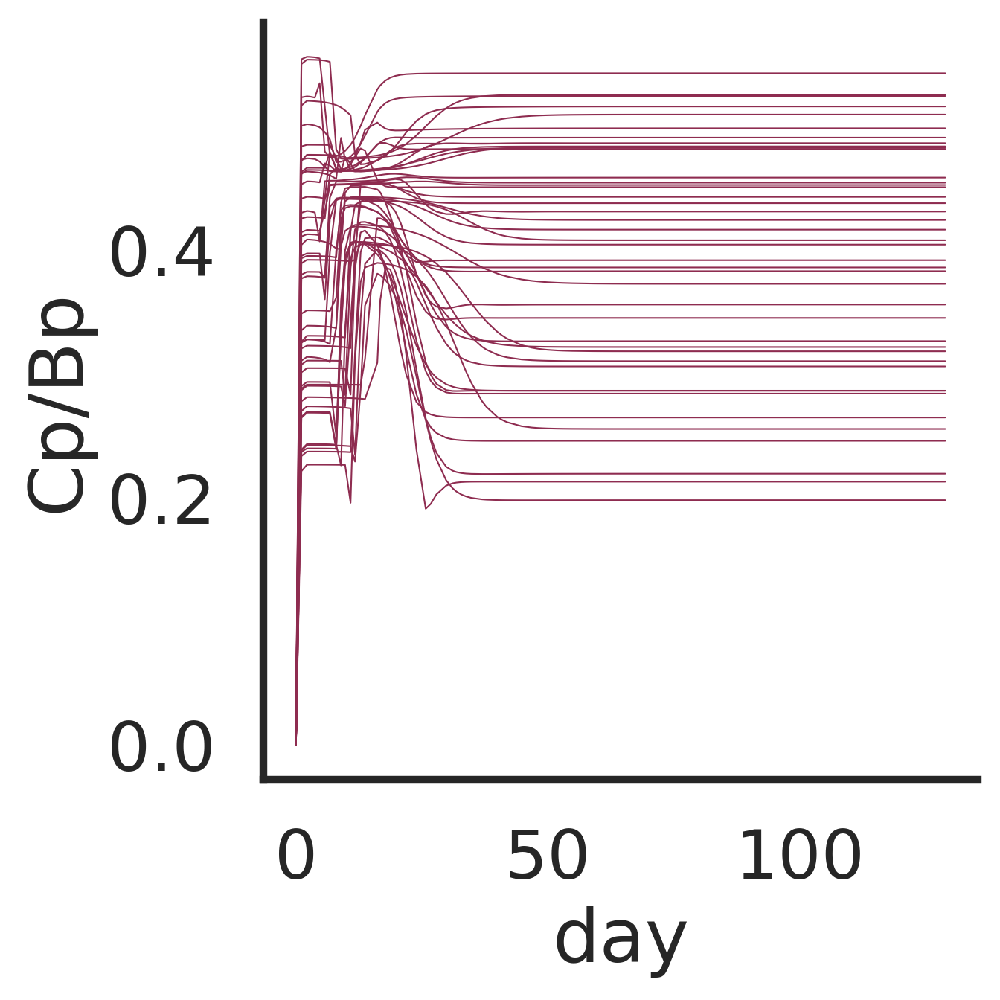

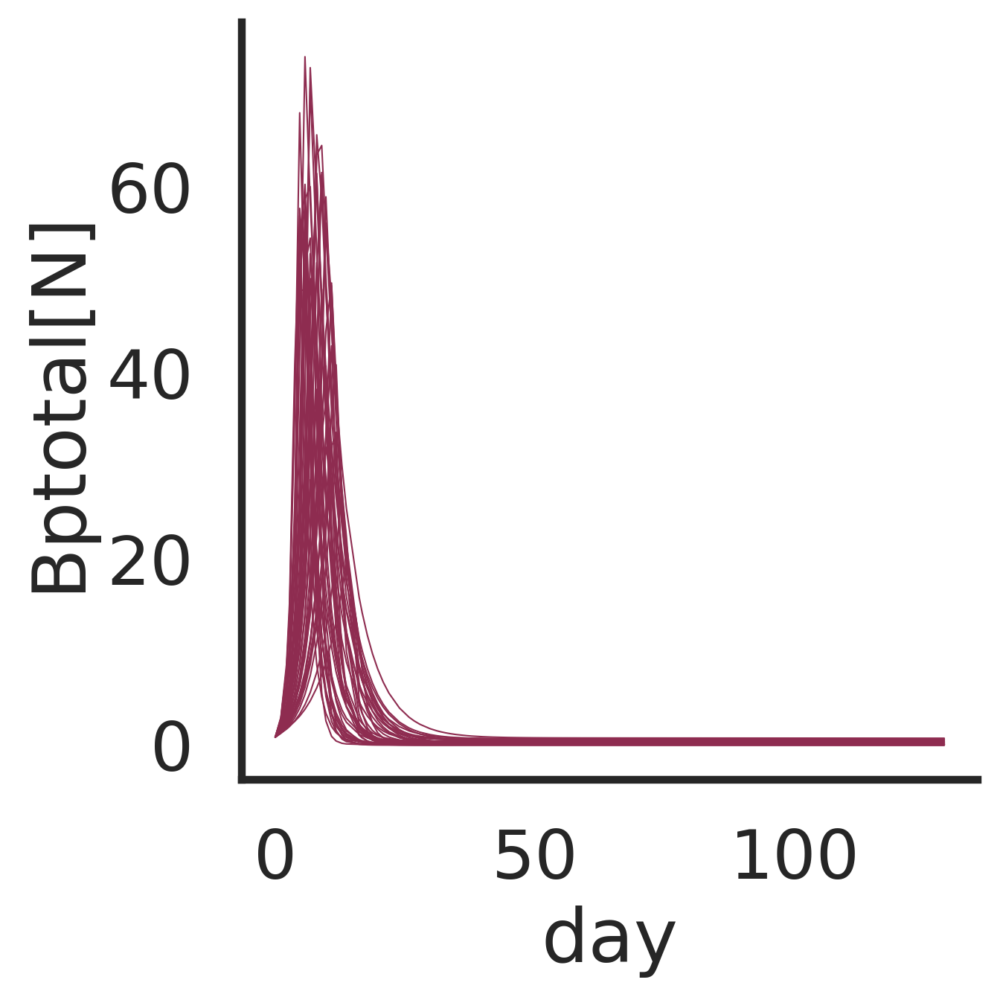

In [110]:
for n in ('QCp', 'Np/Bp','Cp/Bp', 'Bptotal[N]'):
    l= 'RMSE'
    g = sns.relplot(
        data=bestdf.loc[bestdf.media.isin([('lowN')])],
        kind='line', 
        estimator=None, units='idx',
        x='day', y=n, 
                        lw=0.5,
        #hue='labels', hue_order=corder, palette='Set2',
        hue='model', hue_order=morder, palette=mpalette,
        #col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        legend=False
    )
    #g.set(ylabel=f'{n} biomass (umol/L)')
    #g.set_titles(col_template='{col_name}', row_template='{row_name}')
    #plt.suptitle(n, y=1.03)

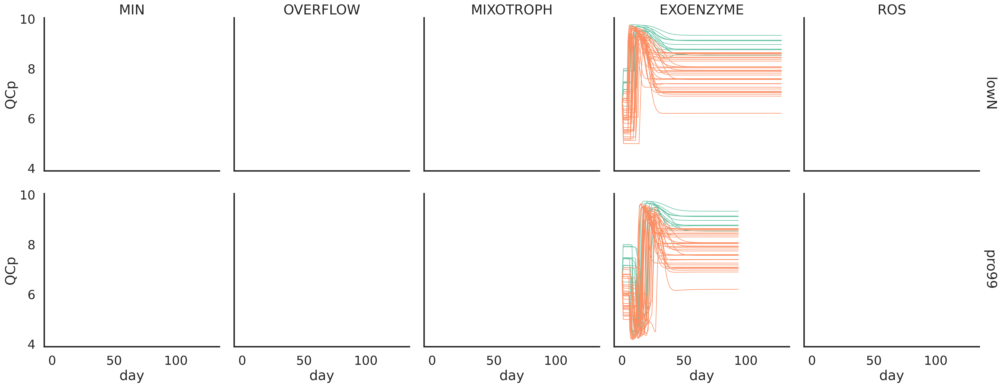

In [111]:

for n in ('N',):
    l= 'RMSE'
    g = sns.relplot(
        data=bestdf,
        kind='line', 
        estimator=None, units='idx',
        x='day', y=f'QCp', 
        row='media', row_order=media_order, lw=1,
        hue='labels', hue_order=corder, palette='Set2',
        col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        legend=False
    )
#     g.set(ylabel=f'{n} biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    #plt.suptitle(f'{n} - top models ({l})', y=1.03)

In [112]:
mparams_df['cluster_'] = mparams_df.cluster.fillna('bad fit')

In [113]:
mparams_df.loc[~mparams_df['FC'].isna()].variable.unique()

array(['VmaxICp', 'VmaxINp', 'KICp', 'KINp', 'Mp', 'gammaDp'],
      dtype=object)

In [118]:
mparams_df.variable.unique()

array(['VmaxICp', 'VmaxINp', 'KICp', 'KINp', 'Mp', 'gammaDp',
       'Vmax/K ICp', 'Vmax/K INp', 'R* INp', 'R* ICp', 'Vmax/Vmax Ip'],
      dtype=object)

In [117]:
sum_df.columns

Index(['VmaxICp', 'VmaxICh', 'VmaxINp', 'VmaxINh', 'VmaxOCp', 'VmaxOCh',
       'VmaxONp', 'VmaxONh', 'KICp', 'KICh', 'KINp', 'KINh', 'KOCp', 'KOCh',
       'KONp', 'KONh', 'Mp', 'Mh', 'gammaDp', 'gammaDh', 'Rp', 'Rh', 'QCmaxp',
       'QCminp', 'QCmaxh', 'QCminh', 'Kmtbp', 'Kmtbh', 'bp', 'bh', 'r0p',
       'r0h', 'KdecayDON', 'KprodEXOp', 'KprodEXOh', 'OverflowMode',
       'Koverflowp', 'Koverflowh', 'ROSMode', 'KprodROSp', 'KprodROSh',
       'KlossROSp', 'KlossROSh', 'KdecayROS', 'omegaP', 'omegaH', 'ROSmaxD',
       'run_id', 'idx', 'id', 'media', 'which', 'model', 'hash', 'Vmax/K ICp',
       'Vmax/K INp', 'R* INp', 'R* ICp', 'Vmax/Vmax Ip'],
      dtype='object')

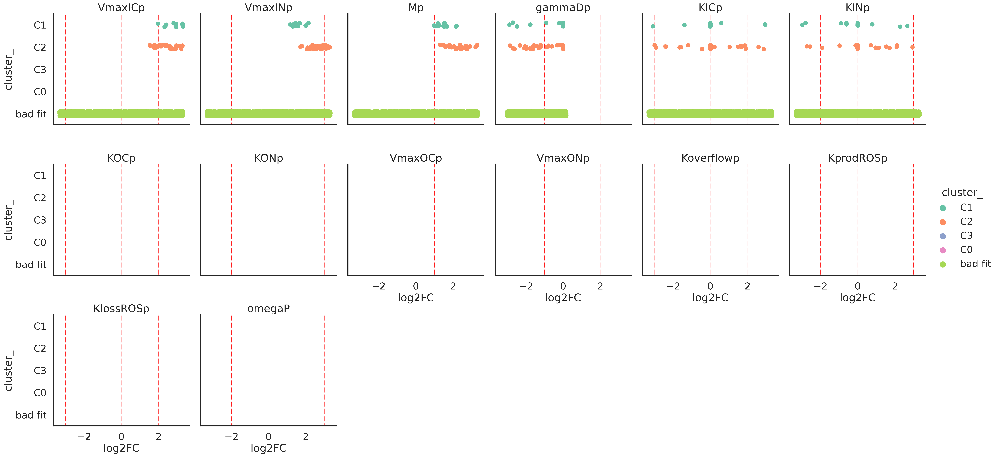

In [114]:
sns.set_context('poster')
corder1 = corder + ['C0', 'bad fit']
porder = ['VmaxICp', 'VmaxINp',  'Mp', 'gammaDp', 'KICp', 'KINp', 'KOCp',
       'KONp', 'VmaxOCp', 'VmaxONp','Koverflowp', 'KprodROSp', 'KlossROSp',
       'omegaP']
g = sns.catplot(
    data=mparams_df.loc[~mparams_df['FC'].isna()].reset_index(), 
    col='variable', x='FC', y='cluster_', col_wrap=6, order=corder1,
    hue='cluster_', hue_order=corder1, palette='Set2', s=100, 
    col_order=porder,
    #dodge=True,
    #legend=False,
).set_titles(col_template='{col_name}', row_template='{row_name}').set(xlabel='log2FC')

for (#row_val,
     col_val), ax in g.axes_dict.items():
    #refmean = refmaxday_df.loc[refmaxday_df['media'].isin([col_val]), col].mean()
    for i in [-3,-2,-1,0,1,2,3]:
        ax.axvline(i, color='red', ls='--', alpha=0.8, lw=0.5)


In [119]:
mtmp1.columns

Index(['model', 'idx', 'VmaxICp', 'VmaxINp', 'Mp', 'labels',
       'log2FC(VmaxINp)/log2FC(Mp)', 'log2FC(VmaxICp)/log2FC(Mp)'],
      dtype='object', name='variable')

In [120]:
mparams_df.loc[
    mparams_df.variable.isin(['VmaxICp', 'VmaxINp', 'Mp',])
    
].pivot_table(index='cluster', columns='variable', values='value', aggfunc=['mean', 'std'])*24*3600

mean                           std                    
variable        Mp   VmaxICp   VmaxINp        Mp   VmaxICp   VmaxINp
cluster                                                             
C1        0.289737  3.545139  1.447648  0.087746  0.966971  0.314543
C2        0.495479  2.577457  3.074437  0.177351  0.932579  0.818501

In [123]:
out_dpath = 'VPRO/OVERFLOW_fix'
for m in morder:
    os.makedirs(os.path.join(out_dpath, m), exist_ok=True)

In [127]:
#vpro_32_25_OVERFLOW_C2.json
cluster_ids.index.str.replace('monte_ponly_fix_EXOENZYME','vpro_2', regex=False).str.replace('_monte__', '_', regex=True)

Index(['vpro_2_46_43_EXOENZYME', 'vpro_2_11_64_EXOENZYME',
       'vpro_2_81_23_EXOENZYME', 'vpro_2_17_73_EXOENZYME',
       'vpro_2_59_93_EXOENZYME', 'vpro_2_7_89_EXOENZYME',
       'vpro_2_97_24_EXOENZYME', 'vpro_2_17_91_EXOENZYME',
       'vpro_2_53_62_EXOENZYME', 'vpro_2_21_35_EXOENZYME',
       'vpro_2_30_38_EXOENZYME', 'vpro_2_38_49_EXOENZYME',
       'vpro_2_2_42_EXOENZYME', 'vpro_2_58_56_EXOENZYME',
       'vpro_2_45_77_EXOENZYME', 'vpro_2_15_42_EXOENZYME',
       'vpro_2_32_60_EXOENZYME', 'vpro_2_34_82_EXOENZYME',
       'vpro_2_82_48_EXOENZYME', 'vpro_2_19_32_EXOENZYME',
       'vpro_2_97_86_EXOENZYME', 'vpro_2_34_94_EXOENZYME',
       'vpro_2_81_95_EXOENZYME', 'vpro_2_58_79_EXOENZYME',
       'vpro_2_60_53_EXOENZYME', 'vpro_2_42_23_EXOENZYME',
       'vpro_2_1_98_EXOENZYME', 'vpro_2_94_66_EXOENZYME',
       'vpro_2_36_16_EXOENZYME', 'vpro_2_66_84_EXOENZYME',
       'vpro_2_1_38_EXOENZYME', 'vpro_2_19_43_EXOENZYME',
       'vpro_2_59_50_EXOENZYME', 'vpro_2_89_70_EXOENZYME',
 

In [130]:
import re
labeldict = cluster_ids.to_dict()['labels']
for idx in labeldict:
    ser_x = mparams_df.loc[
        mparams_df.idx.isin([idx]) & ~mparams_df.FC.isna(), ['variable', 'value']
    ]
    ser_x.index= ser_x.variable
    actual_finalX = ser_x.value.to_dict()
    vpro_id = idx.replace('monte_ponly_fix_EXOENZYME','vpro_2').replace('_monte__','_')
    #for m in morder:
        #vpro_id = vpro_id.replace(f'{m}_','', 1)
        #vpro_id = vpro_id.replace(f'_{m}','')
        #pass
    fname = vpro_id
    model = mparams_df.loc[mparams_df.idx.isin([idx])]['model'].unique()[0]
    res_fpath = os.path.join(out_dpath, model, f'{fname}.json')
    print(res_fpath)
    params2json(actual_finalX, res_fpath)


VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_46_43_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_11_64_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_81_23_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_17_73_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_59_93_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_7_89_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_97_24_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_17_91_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_53_62_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_21_35_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_30_38_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_38_49_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_2_42_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_58_56_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_45_77_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_15_42_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_32_60_EXOENZYME.json
VPRO/OVERFLOW_fix/EXOENZYME/vpro_2_34_82_EXOENZYME